In [1]:
import numpy as np
import scipy as sp
import torch
import time
import copy
import pickle
import matplotlib
import matplotlib.pyplot as plt
import networkx as nx
import os
import sys
import torch_geometric
import itertools
from torch_geometric.data import Data
from torch_geometric.nn import GATConv, GCNConv, GATv2Conv
from my_gat import my_GATConv
from my_mlp_gat import my_MLP_GATConv
sys.path.insert(0, os.path.abspath('../../'))
from torch_geometric.datasets import Planetoid

# Data function

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
datasets = [Planetoid(root='data/Cora/', name='Cora'),Planetoid(root='data/PubMed/', name='PubMed'), Planetoid(root='data/CiteSeer/', name='CiteSeer')]

# Setup models

In [4]:
class Model_GAT(torch.nn.Module):
    def __init__(self, d ,out_d, K):
        super(Model_GAT, self).__init__()
        
        self.conv1 = my_GATConv(d, out_d, heads=K, bias_lin=False)
#         self.conv1 = GATv2Conv(d, out_d, heads=K, concat=False, share_weights=True)
#         self.conv1 = my_MLP_GATConv(d, out_d, 2, 100, share_weights=True)

    def forward(self, data):
        
        # 1. Obtain node embeddings 
        x = data.x
        x, attn_weights, pair_pred = self.conv1(x, data.edge_index, return_attention_info=True)
        
        return x.squeeze(-1), attn_weights, pair_pred
    
class Model_MLP_GAT(torch.nn.Module):
    def __init__(self, d ,out_d):
        super(Model_MLP_GAT, self).__init__()
        
        self.conv1 = my_MLP_GATConv(d, out_d, 2, 50, share_weights=True, bias=False)

    def forward(self, data):
        
        # 1. Obtain node embeddings 
        x = data.x
        x, attn_weights, pair_pred = self.conv1(x, data.edge_index, return_attention_info=True)
        
        return x.squeeze(-1), attn_weights, pair_pred
    
class Model_GCN(torch.nn.Module):
    def __init__(self, d ,out_d):
        super(Model_GCN, self).__init__()
        
        self.conv1 = GCNConv(d,out_d, bias=False)

    def forward(self, data):
        
        # 1. Obtain node embeddings 
        x = data.x
        x = self.conv1(x, data.edge_index)
        
        return x.squeeze(-1)
    
class Model_linear(torch.nn.Module):
    def __init__(self, d ,out_d):
        super(Model_linear, self).__init__()
        
        self.linear = torch.nn.Linear(d,out_d, bias=False)

    def forward(self, data):
        
        # 1. Obtain node embeddings 
        x = data.x
        x = self.linear(x)
        
        return x.squeeze(-1)

## Setup train and accuracy functions

In [5]:
def train(model, data, criterion, opt):
    model.train()
    opt.zero_grad()
    logits = model(data) # does a forward computation
    loss = criterion(logits[data.train_mask], data.ynew[data.train_mask]) 
    loss.backward() # this computes the stochastic gradient (or whatever gradient you are using based on the solver)
    opt.step() # this updates the parameters using the gradient that has been computed above.
    return loss
        
@torch.no_grad()
def measure_accuracy(model, data):
    model.eval()
         
    logits = model(data) # forward operation
    preds = torch.sigmoid(logits) > 0.5
    
    # calculate training accuracy
    correct = preds[data.train_mask] == data.ynew[data.train_mask]
    train_acc = int(correct.sum()) / int(data.train_mask.sum())
    
    # calculate training accuracy
    correct = preds[data.test_mask] == data.ynew[data.test_mask]
    test_acc = int(correct.sum()) / int(data.test_mask.sum())
        
    return train_acc, test_acc

## Setup GCN function

In [6]:
def run_gcn(data, d, out_d, device, weight_decay, loss_tol, epochs):
    # Define the model
    model = Model_GCN(d, out_d=out_d).to(device)

    # Define the criterion
    criterion = torch.nn.BCEWithLogitsLoss()

    # Define the solver, check documentation in pytorch for how to set the learning rate.
    opt = torch.optim.Adam(model.parameters(), lr=1.0e-3, weight_decay=weight_decay)

    # Test using the randomly initialized parameters.
    train_acc, test_acc = measure_accuracy(model, data)

    for epoch in range(1, epochs):
        loss = train(model, data, criterion, opt) # Performs an Adam step etc.
        train_acc, test_acc = measure_accuracy(model, data) # Test at each epoch
#         if loss <= 1.0e-2 or train_acc > 0.99:
        if loss <= loss_tol:
            break
#         print(f"q: {epoch:0.1f} | Loss: {loss:0.15f} | Train: {train_acc:0.4f} | Test: {test_acc:0.4f}")
    return loss, train_acc, test_acc

## Setup linear model

In [7]:
def run_linear(data, d, out_d, device, weight_decay, loss_tol, epochs):
    # Define the model
    model = Model_linear(d, out_d=out_d).to(device)

    # Define the criterion
    criterion = torch.nn.BCEWithLogitsLoss()

    # Define the solver, check documentation in pytorch for how to set the learning rate.
    opt = torch.optim.Adam(model.parameters(), lr=1.0e-3, weight_decay=weight_decay)

    # Test using the randomly initialized parameters.
    train_acc, test_acc = measure_accuracy(model, data)

    for epoch in range(1, epochs):
        loss = train(model, data, criterion, opt) # Performs an Adam step etc.
        train_acc, test_acc = measure_accuracy(model, data) # Test at each epoch
#         if loss <= 1.0e-2 or train_acc > 0.99:
        if loss <= loss_tol:
            break
#         print(f"q: {epoch:0.1f} | Loss: {loss:0.15f} | Train: {train_acc:0.4f} | Test: {test_acc:0.4f}")
    return loss, train_acc, test_acc

## Setup MLP GAT and GAT

In [8]:
def train_gat(model, data, criterion, opt):
    model.train()
    opt.zero_grad()
    logits, attn_weights, pair_pred = model(data) # does a forward computation
    loss = criterion(logits[data.train_mask], data.ynew[data.train_mask]) 
    loss.backward() # this computes the stochastic gradient (or whatever gradient you are using based on the solver)
    opt.step() # this updates the parameters using the gradient that has been computed above.
    return loss
        
@torch.no_grad()
def measure_accuracy_gat(model, data):
    model.eval()
         
    logits, attn_weights, pair_pred = model(data) # forward operation
    preds = torch.sigmoid(logits) > 0.5
    
    # calculate training accuracy
    correct = preds[data.train_mask] == data.ynew[data.train_mask]
    train_acc = int(correct.sum()) / int(data.train_mask.sum())
    
    # calculate training accuracy
    correct = preds[data.test_mask] == data.ynew[data.test_mask]
    test_acc = int(correct.sum()) / int(data.test_mask.sum())
        
    return train_acc, test_acc

In [9]:
def run_mlp_gat(data, d, out_d, device, weight_decay, loss_tol, epochs):
    # Define the model
    model = Model_MLP_GAT(d, out_d=out_d).to(device)

    # Define the criterion
    criterion = torch.nn.BCEWithLogitsLoss()

    # Define the solver, check documentation in pytorch for how to set the learning rate.
    opt = torch.optim.Adam(model.parameters(), lr=1.0e-3, weight_decay=weight_decay)
#     scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, 'min')

    # Test using the randomly initialized parameters.
    train_acc, test_acc = measure_accuracy_gat(model, data)

    for epoch in range(1, epochs):
        loss = train_gat(model, data, criterion, opt) # Performs an Adam step etc.
        train_acc, test_acc = measure_accuracy_gat(model, data) # Test at each epoch
#         if loss <= 1.0e-2 or train_acc > 0.99:
        if loss <= loss_tol:
            break
#         print(f"q: {epoch:0.1f} | Loss: {loss:0.15f} | Train: {train_acc:0.4f} | Test: {test_acc:0.4f}")
    return loss, train_acc, test_acc, model

In [10]:
def run_gat(data, d, out_d, K, device, weight_decay, loss_tol, epochs):
    # Define the model
    model = Model_GAT(d, out_d=out_d, K=K).to(device)

    # Define the criterion
    criterion = torch.nn.BCEWithLogitsLoss()

    # Define the solver, check documentation in pytorch for how to set the learning rate.
    opt = torch.optim.Adam(model.parameters(), lr=1.0e-3, weight_decay=weight_decay)
#     scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, 'min')

    # Test using the randomly initialized parameters.
    train_acc, test_acc = measure_accuracy_gat(model, data)

    for epoch in range(1, epochs):
        loss = train_gat(model, data, criterion, opt) # Performs an Adam step etc.
        train_acc, test_acc = measure_accuracy_gat(model, data) # Test at each epoch
#         if loss <= 1.0e-2 or train_acc > 0.99:
        if loss <= loss_tol:
            break
#         print(f"q: {epoch:0.1f} | Loss: {loss:0.15f} | Train: {train_acc:0.4f} | Test: {test_acc:0.4f}")
    return loss, train_acc, test_acc, model

## Utility functions

In [11]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

def info_mlp_gat(attn_weights, idx, head):
    intra_weight = []
    idx_intra = []
    inter_weight = []
    idx_inter = []

    weights = attn_weights[1]

    idx_class0 = idx.nonzero(as_tuple=True)[0]
    idx_class1 = (~idx).nonzero(as_tuple=True)[0]
    for i in range(attn_weights[0].shape[1]):
        edge = [attn_weights[0][0][i].item(),attn_weights[0][1][i].item()]
        if ((edge[0] in idx_class0) and (edge[1] in idx_class0)) or ((edge[0] in idx_class1) and (edge[1] in idx_class1)):
            intra_weight.append(weights[i].item())
            idx_intra.append(i)
        else:
            inter_weight.append(weights[i].item())
            idx_inter.append(i)
    return intra_weight, idx_intra, inter_weight, idx_inter

def info_gat(attn_weights, idx, head):
    intra_weight = [[],[]]
    idx_intra = [[],[]]
    inter_weight = [[],[]]
    idx_inter = [[],[]]

    weights = attn_weights[1][:,head]
    idx_class0 = idx.nonzero(as_tuple=True)[0]
    idx_class1 = (~idx).nonzero(as_tuple=True)[0]
    
    for i in range(attn_weights[0].shape[1]):
        edge = [attn_weights[0][0][i].item(),attn_weights[0][1][i].item()]
        if ((edge[0] in idx_class0) and (edge[1] in idx_class0)):
            intra_weight[0].append(weights[i].item())
            idx_intra[0].append(i)
        elif ((edge[0] in idx_class1) and (edge[1] in idx_class1)):
            intra_weight[1].append(weights[i].item())
            idx_intra[1].append(i)
        elif ((edge[0] in idx_class0) and (edge[1] in idx_class1)):
            inter_weight[0].append(weights[i].item())
            idx_inter[0].append(i)
        else: 
            inter_weight[1].append(weights[i].item())
            idx_inter[1].append(i)
            
    return intra_weight, idx_intra, inter_weight, idx_inter

def my_plot_violin(intra_weight, inter_weight):
    plt.figure(figsize=(10, 6), dpi=80)
    ww_intra = np.ones_like(intra_weight)/len(intra_weight)
    ww_inter = np.ones_like(inter_weight)/len(inter_weight)
#     plt.hist(intra_weight, bins=500, weights=ww_intra, alpha=0.9, label='Intra')
#     plt.hist(inter_weight, bins=500, weights=ww_inter, alpha=0.6, label='Inter')
    pos = [1, 1.5]
    plt.violinplot([intra_weight, inter_weight], pos, points=20, widths=0.3,
                     showmeans=True, showextrema=True, showmedians=False)
    plt.legend(loc='upper right')
    plt.yscale('linear')
    plt.show()
    
def pair_acc(n_edges, pair_pred, idx_intra, idx_inter, head):
    
    tmp = torch.zeros(n_edges).to(device)
    tmp[pair_pred[:,head].reshape(len(pair_pred)) > 0] = 1

    gt = torch.zeros(n_edges).to(device)
    gt[idx_intra] = 1

    acc_intra_edges = 1 - torch.sum(torch.abs(gt[idx_intra] - tmp[idx_intra]))/len(idx_intra)
    acc_inter_edges = 1 - torch.sum(torch.abs(gt[idx_inter] - tmp[idx_inter]))/len(idx_inter)
    print("Head: ", head, " acc intra edges: ", acc_intra_edges.item(), " acc inter edges: ", acc_inter_edges.item())
    
    return acc_intra_edges, acc_inter_edges

def my_plot(name, which_class, heads, mus, degree, intra_gamma, inter_gamma, intra_gamma_, inter_gamma_, 
            intra_gamma_std, inter_gamma_std, intra_gamma_std_, inter_gamma_std_, 
            test_acc_mlp_gat, test_acc_gat, test_acc_gcn, test_acc_lin, 
            acc_intra_edges_all, acc_inter_edges_all, acc_intra_edges_all_, acc_inter_edges_all_):
    
    mus = mus.cpu()
    
    fig = plt.figure(figsize=(11, 7), dpi=80)

    plt.plot(mus,intra_gamma, linewidth=2, linestyle='-', marker='*', markersize=9, label='Average $\gamma$, intra edges, MLP-GAT')
#     plt.fill_between(mus,np.asarray(intra_gamma)-np.asarray(intra_gamma_std),np.asarray(intra_gamma)+np.asarray(intra_gamma_std),alpha=0.4)

    plt.plot(mus,inter_gamma, linewidth=2, linestyle='-', marker='X', markersize=9, label='Average $\gamma$, inter edges, MLP-GAT')
#     plt.fill_between(mus,np.asarray(inter_gamma)-np.asarray(inter_gamma_std),np.asarray(inter_gamma)+np.asarray(inter_gamma_std),alpha=0.4)
    
    d_mean = (1+degree).mean().cpu()
#     inv_d_std = (1/(1+degree)).std().cpu()
    inv_degree_mean_vec = (1/d_mean)*np.ones(len(mus))
    
    plt.plot(mus,inv_degree_mean_vec, linewidth=2, linestyle='-', marker='o', markersize=9, color = 'black', label='Average $1/|N_i|$')
#     plt.fill_between(mus,inv_degree_mean_vec-inv_d_std,inv_degree_mean_vec+inv_d_std,alpha=0.4)

    plt.grid(linestyle='dashed')
    plt.legend(fontsize=20)
    plt.xscale('log')
    plt.tick_params(axis='x', labelsize=18)
    plt.tick_params(axis='y', labelsize=18)
    plt.xlabel('Distance between means', fontsize=20)
    plt.ylabel('$\gamma$ value', fontsize=20)
    plt.show()
    
    fig.savefig("figures/gammas_MLPGAT_real_data_training_"+name+"_class_"+str(which_class)+".pdf", dpi=400, bbox_inches='tight')
    
    fig = plt.figure(figsize=(11, 7), dpi=80)

    plt.plot(mus,intra_gamma_std, linewidth=2, linestyle='-', marker='*', markersize=9, label='Stand. dev. $\gamma$, intra edges, MLP-GAT')

    plt.plot(mus,inter_gamma_std, linewidth=2, linestyle='-', marker='X', markersize=9, label='Stand. dev. $\gamma$, inter edges, MLP-GAT')
    
#     d_mean = (1+degree).mean().cpu()
    inv_d_std = (1/(1+degree)).std().cpu()
#     inv_degree_mean_vec = (1/d_mean)*np.ones(len(mus))
    
    plt.plot(mus,inv_d_std*np.ones(len(mus)), linewidth=2, linestyle='-', marker='o', markersize=9, color = 'black', label='Stand. dev. $1/|N_i|$')

    plt.grid(linestyle='dashed')
    plt.legend(fontsize=20)
    plt.xscale('log')
    plt.tick_params(axis='x', labelsize=18)
    plt.tick_params(axis='y', labelsize=18)
    plt.xlabel('Distance between means', fontsize=20)
    plt.ylabel('Value', fontsize=20)
    plt.show()
    
    fig.savefig("figures/gammas_std_MLPGAT_real_data_training_"+name+"_class_"+str(which_class)+".pdf", dpi=400, bbox_inches='tight')
    
    fig = plt.figure(figsize=(16, 12), dpi=80)

    marker_intra = ['v','^','>','<']
    marker_inter = ['1','2','3','4']

    ct = 0
    for head in range(heads):
        for class_ in range(2):
            plt.plot(mus,intra_gamma_[head][class_], linewidth=2, linestyle='-', marker=marker_intra[ct], markersize=9, label='Average $\gamma$, intra edges, GAT'+', head '+str(head) + ", class " + str(class_))
#             plt.fill_between(mus,np.asarray(intra_gamma_[head][class_])-np.asarray(intra_gamma_std_[head][class_]),np.asarray(intra_gamma_[head][class_])+np.asarray(intra_gamma_std_[head][class_]),alpha=0.4)

            plt.plot(mus,inter_gamma_[head][class_], linewidth=2, linestyle='-', marker=marker_inter[ct], markersize=9, label='Average $\gamma$, inter edges, GAT'+', head '+str(head) + ", class " + str(class_))
#             plt.fill_between(mus,np.asarray(inter_gamma_[head][class_])-np.asarray(inter_gamma_std_[head][class_]),np.asarray(inter_gamma_[head][class_])+np.asarray(inter_gamma_std_[head][class_]),alpha=0.4)
            ct += 1
    
    d_mean = (1+degree).mean().cpu()
#     inv_d_std = (1/(1+degree)).std().cpu()
    inv_degree_mean_vec = (1/d_mean)*np.ones(len(mus))
    
    plt.plot(mus,inv_degree_mean_vec, linewidth=2, linestyle='-', marker='o', markersize=9, color = 'black', label='Average $1/|N_i|$')
#     plt.fill_between(mus,inv_degree_mean_vec-inv_d_std,inv_degree_mean_vec+inv_d_std,alpha=0.4)

    plt.grid(linestyle='dashed')
    plt.legend(fontsize=20)
    plt.xscale('log')
    plt.tick_params(axis='x', labelsize=18)
    plt.tick_params(axis='y', labelsize=18)
    plt.xlabel('Distance between means', fontsize=20)
    plt.ylabel('$\gamma$ value', fontsize=20)
    
    fig.savefig("figures/gammas_GAT_real_data_training_"+name+"_class_"+str(which_class)+".pdf", dpi=400, bbox_inches='tight')
    
    fig = plt.figure(figsize=(16, 12), dpi=80)

    ct = 0
    for head in range(heads):
        for class_ in range(2):
            plt.plot(mus,intra_gamma_std_[head][class_], linewidth=2, linestyle='-', marker=marker_intra[ct], markersize=9, label='Stand. dev. $\gamma$, intra edges, GAT'+', head '+str(head) + ", class " + str(class_))
            plt.plot(mus,inter_gamma_std_[head][class_], linewidth=2, linestyle='-', marker=marker_inter[ct], markersize=9, label='Stand. dev. $\gamma$, inter edges, GAT'+', head '+str(head) + ", class " + str(class_))
            ct += 1

    
    plt.plot(mus,inv_d_std*np.ones(len(mus)), linewidth=2, linestyle='-', marker='o', markersize=9, color = 'black', label='Stand. dev. $1/|N_i|$')

    plt.grid(linestyle='dashed')
    plt.legend(fontsize=20)
    plt.xscale('log')
    plt.tick_params(axis='x', labelsize=18)
    plt.tick_params(axis='y', labelsize=18)
    plt.xlabel('Distance between means', fontsize=20)
    plt.ylabel('$\gamma$ value', fontsize=20)
    
    fig.savefig("figures/gammas_std_GAT_real_data_training_"+name+"_class_"+str(which_class)+".pdf", dpi=400, bbox_inches='tight')
    
    fig = plt.figure(figsize=(11, 7), dpi=80)

    plt.plot(mus,test_acc_mlp_gat, linewidth=2, linestyle='-', marker='*', markersize=9, label='MLP-GAT')
#     plt.plot(mus,test_acc_gat, linewidth=2, linestyle='-', marker='X', markersize=9, label='GAT')
    plt.plot(mus,test_acc_gcn, linewidth=2, linestyle='-', marker='s', markersize=9, label='GCN')
    plt.plot(mus,test_acc_lin, linewidth=2, linestyle='-', marker='D', markersize=9, color = 'purple', label='No-graph')

    plt.grid(linestyle='dashed')
    plt.legend(fontsize=20)
    plt.xscale('log')
    plt.tick_params(axis='x', labelsize=18)
    plt.tick_params(axis='y', labelsize=18)
    plt.xlabel('Distance between means', fontsize=20)
    plt.ylabel('Classification accuracy', fontsize=20)
    plt.show()
    
    fig.savefig("figures/node_classification_MLPGAT_real_data_training_"+name+"_class_"+str(which_class)+".pdf", dpi=400, bbox_inches='tight')
    
    fig = plt.figure(figsize=(16, 12), dpi=80)

#     plt.plot(mus,test_acc_mlp_gat, linewidth=2, linestyle='-', marker='*', markersize=9, label='MLP-GAT')
    plt.plot(mus,test_acc_gat, linewidth=2, linestyle='-', marker='X', markersize=9, label='GAT')
    plt.plot(mus,test_acc_gcn, linewidth=2, linestyle='-', marker='s', markersize=9, label='GCN')
    plt.plot(mus,test_acc_lin, linewidth=2, linestyle='-', marker='D', markersize=9, color = 'purple', label='No-graph')

    plt.grid(linestyle='dashed')
    plt.legend(fontsize=20)
    plt.xscale('log')
    plt.tick_params(axis='x', labelsize=18)
    plt.tick_params(axis='y', labelsize=18)
    plt.xlabel('Distance between means', fontsize=20)
    plt.ylabel('Classification accuracy', fontsize=20)
    plt.show()
    
    fig.savefig("figures/node_classification_GAT_real_data_training_"+name+"_class_"+str(which_class)+".pdf", dpi=400, bbox_inches='tight')
    
    fig = plt.figure(figsize=(11, 7), dpi=80)

    plt.plot(mus,acc_intra_edges_all, linewidth=2, linestyle='-', marker='*', markersize=9, label='MLP-GAT, intra edge classification')
    plt.plot(mus,acc_inter_edges_all, linewidth=2, linestyle='-', marker='X', markersize=9, label='MLP-GAT, inter edge classification')
    
#     for head in range(heads):
#         plt.plot(mus,acc_intra_edges_all_[head], linewidth=2, linestyle='-', marker=marker_intra[head], markersize=9, label='GAT, intra edge classification'+' head '+str(head))
#         plt.plot(mus,acc_inter_edges_all_[head], linewidth=2, linestyle='-', marker=marker_inter[head], markersize=9, label='GAT, inter edge classification'+' head '+str(head))       

    plt.grid(linestyle='dashed')
    plt.legend(fontsize=20)
    plt.xscale('log')
    plt.tick_params(axis='x', labelsize=18)
    plt.tick_params(axis='y', labelsize=18)
    plt.xlabel('Distance between means', fontsize=20)
    plt.ylabel('Classification accuracy', fontsize=20)
    plt.show()
    
    fig.savefig("figures/edge_classification_MLPGAT_real_data_training_"+name+"_class_"+str(which_class)+".pdf", dpi=400, bbox_inches='tight')

## Run experiments

Cora
Number of classes:  tensor(7, device='cuda:0')
Class:  0
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.1
GCN,     Loss: 0.3731960223189422 | Train: 1.0000 | Test: 0.4880
Linear,  Loss: 0.2474482179752418 | Train: 1.0000 | Test: 0.4640
MLP GAT, Loss: 0.2 | Train: 0.9786 | Test: 0.6780
Head:  0  acc intra edges:  0.4404665231704712  acc inter edges:  0.5708061456680298
GAT,     Loss: 0.2 | Train: 1.0000 | Test: 0.5860
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.2
GCN,     Loss: 0.3753603366868836 | Train: 1.0000 | Test: 0.5060
Linear,  Loss: 0.2475812099341835 | Train: 1.0000 | Test: 0.4680
MLP GAT, Loss: 0.2 | Train: 0.9714 | Test: 0.6910
Head:  0  acc intra edges:  0.4179491400718689  acc inter edges:  0.6067538261413574
GAT,     Loss: 0.4 | Train: 0.9857 | Test: 0.4750
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.3
GCN,     Loss: 0.3745041722697871 | Train: 1.00

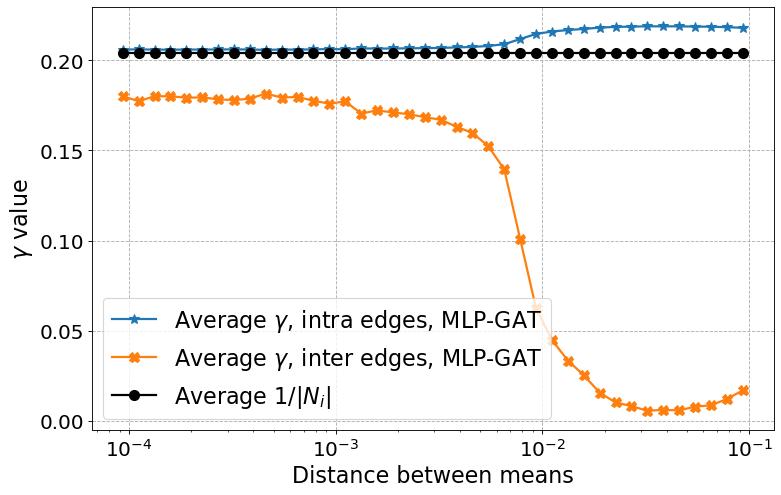

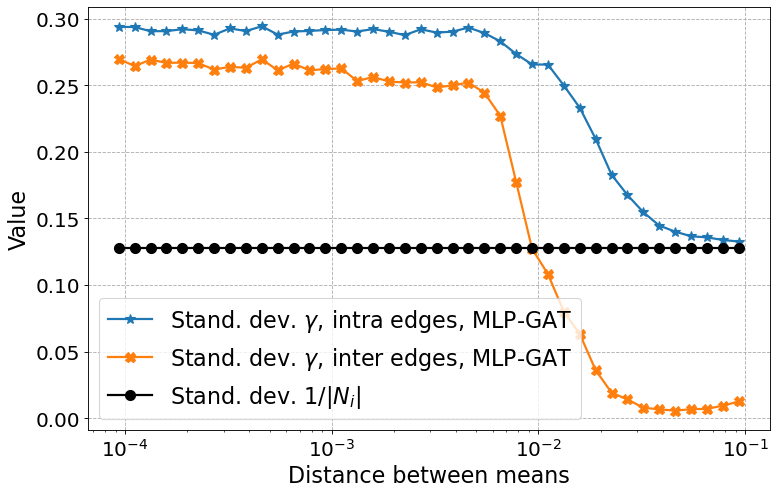

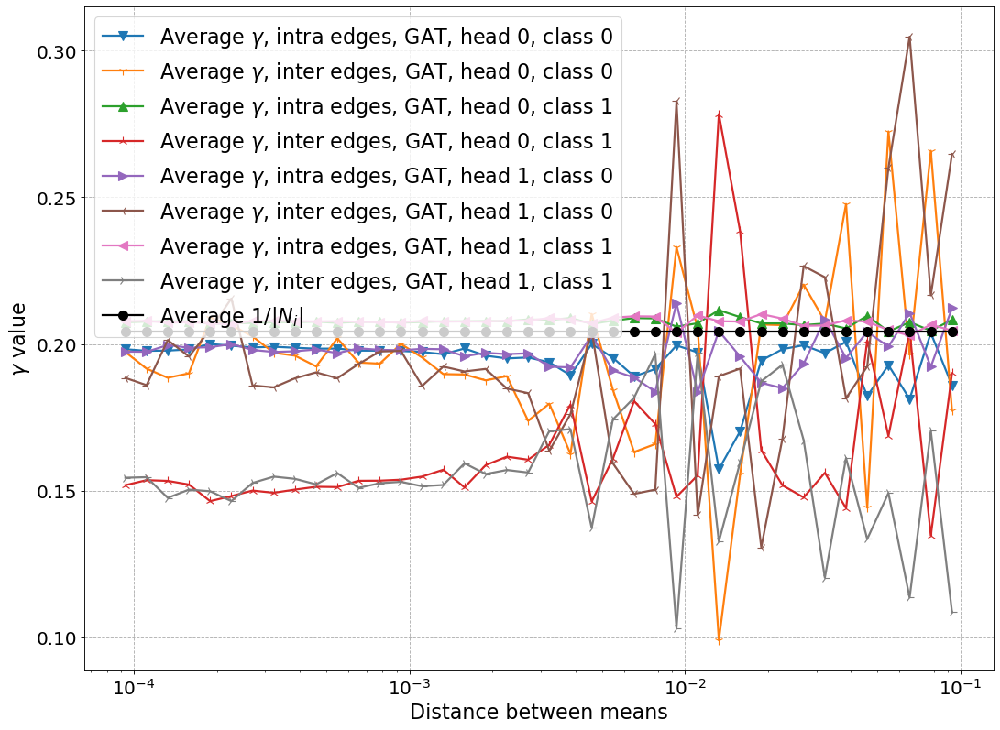

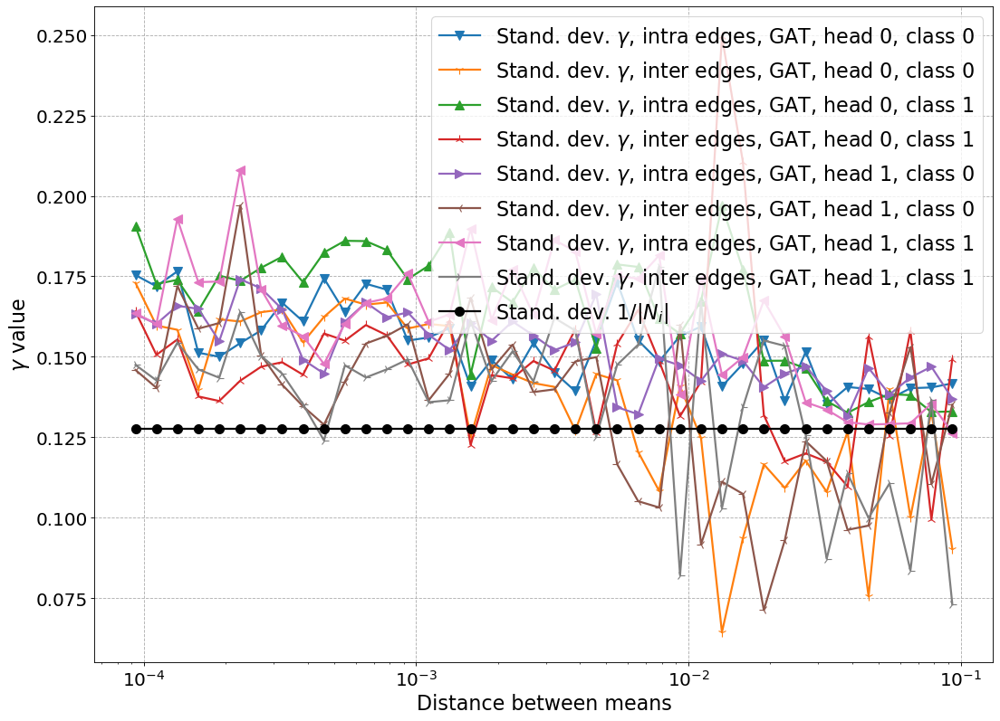

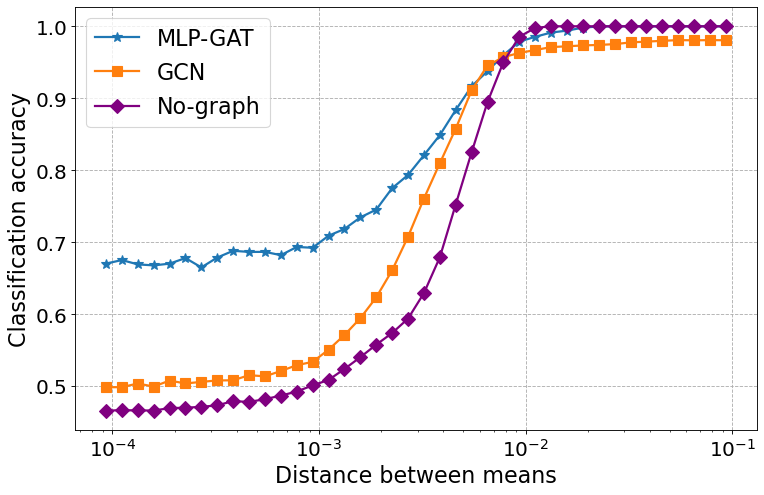

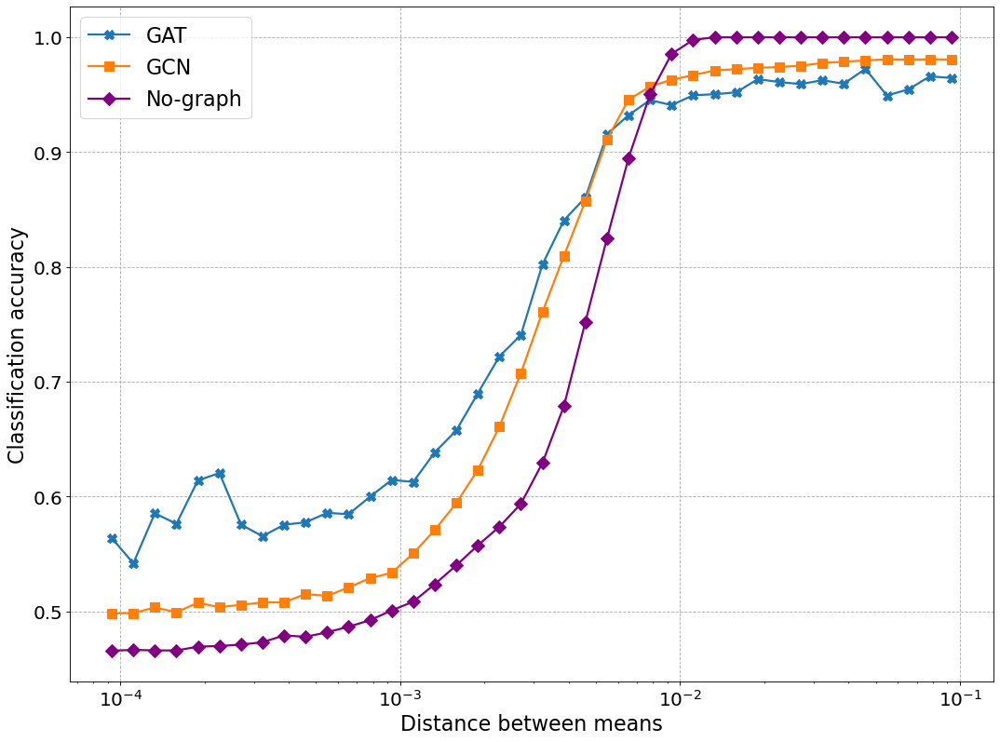

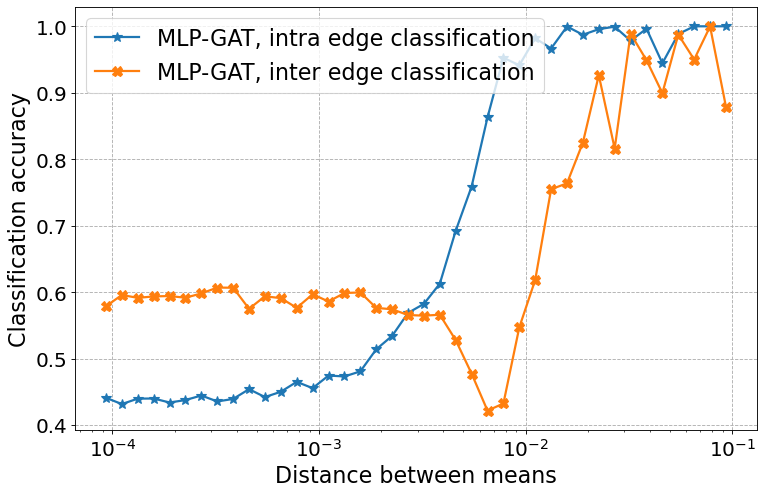

Class:  1
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.1
GCN,     Loss: 0.3820066786703786 | Train: 0.9929 | Test: 0.5160
Linear,  Loss: 0.2407453766358750 | Train: 1.0000 | Test: 0.4680
MLP GAT, Loss: 0.2 | Train: 0.9857 | Test: 0.6920
Head:  0  acc intra edges:  0.43256503343582153  acc inter edges:  0.6421800851821899
GAT,     Loss: 0.4 | Train: 0.9929 | Test: 0.4800
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.2
GCN,     Loss: 0.3826986515096256 | Train: 0.9929 | Test: 0.5010
Linear,  Loss: 0.2392191014119557 | Train: 1.0000 | Test: 0.4610
MLP GAT, Loss: 0.2 | Train: 0.9857 | Test: 0.7280
Head:  0  acc intra edges:  0.4352126121520996  acc inter edges:  0.599526047706604
GAT,     Loss: 0.2 | Train: 1.0000 | Test: 0.6170
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.3
GCN,     Loss: 0.3801926533026355 | Train: 1.0000 | Test: 0.5110
Linear,  Loss: 0.2392175157687494 

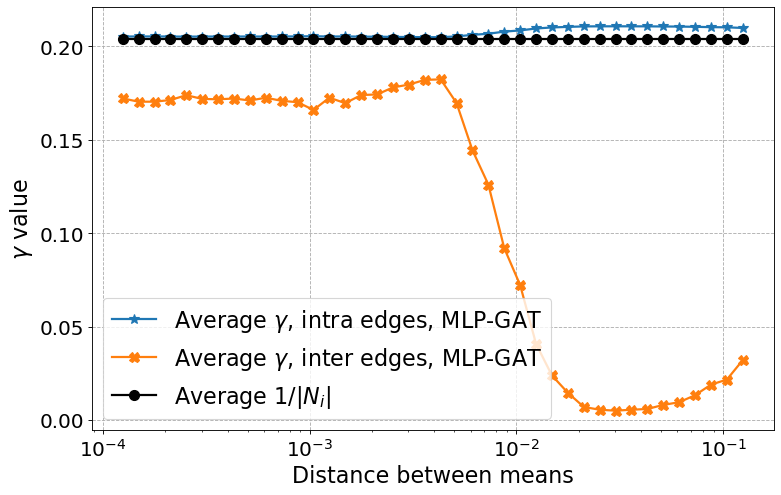

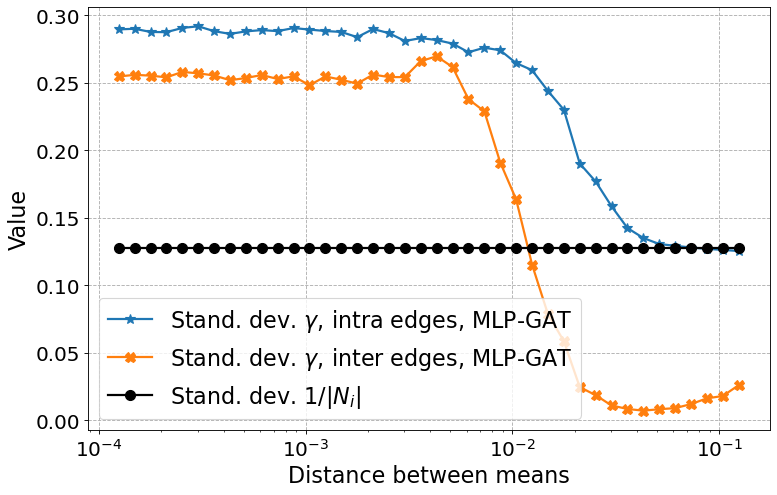

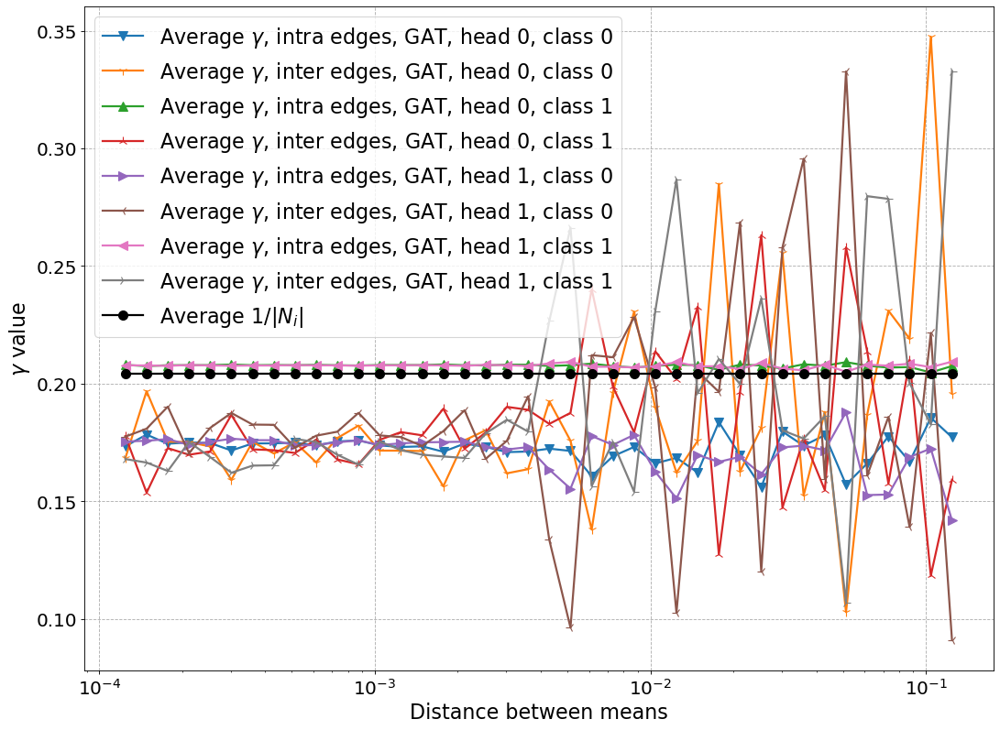

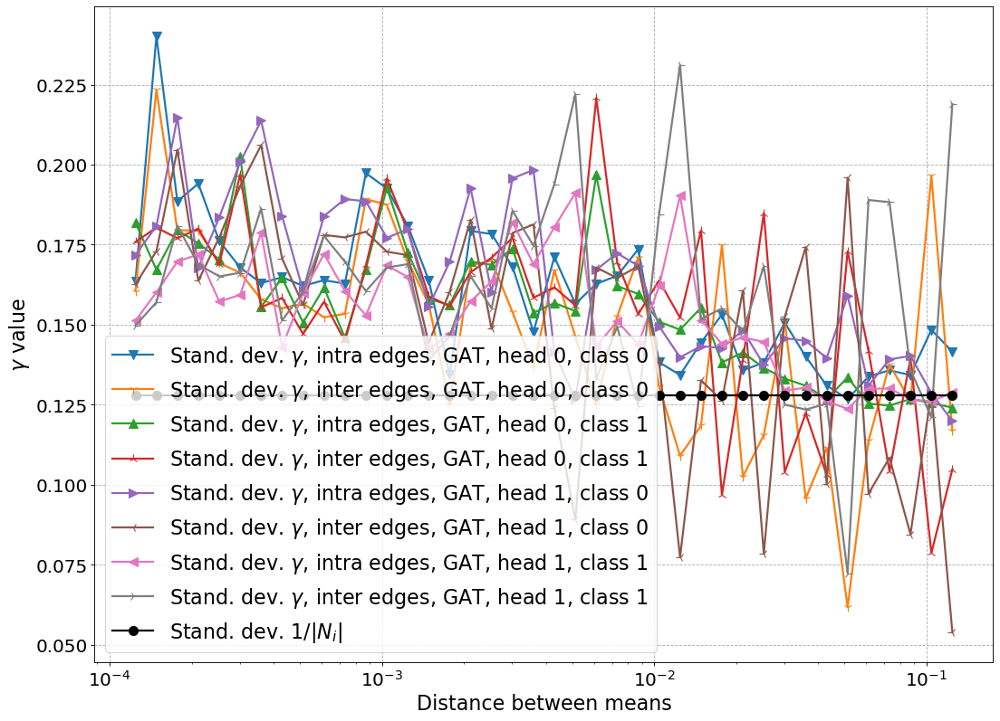

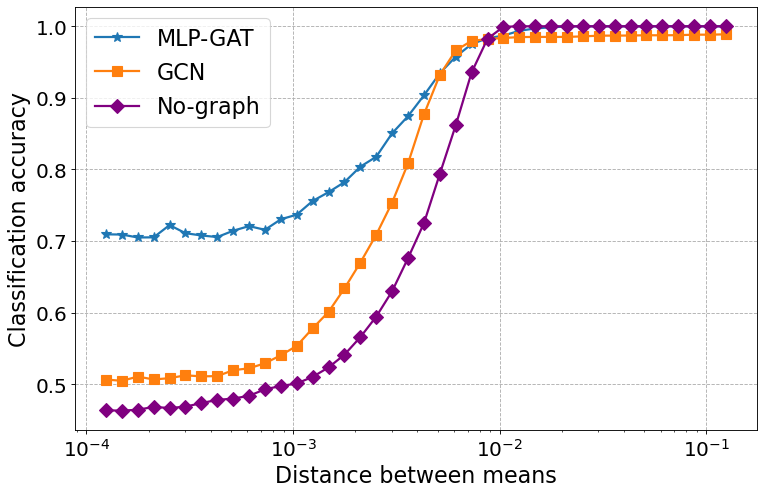

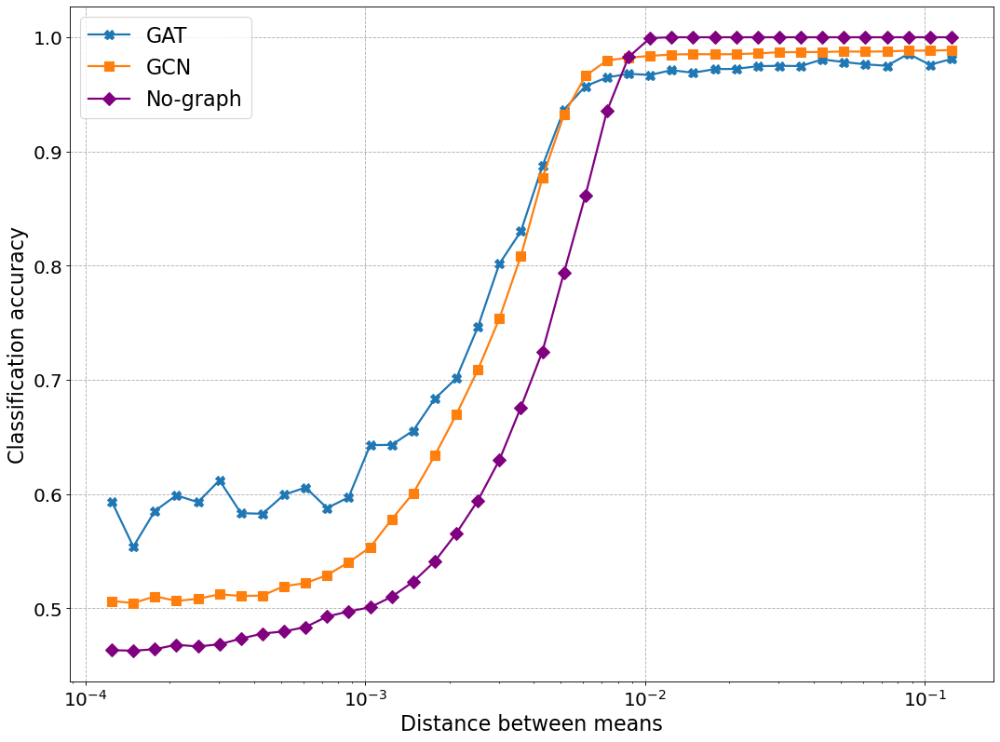

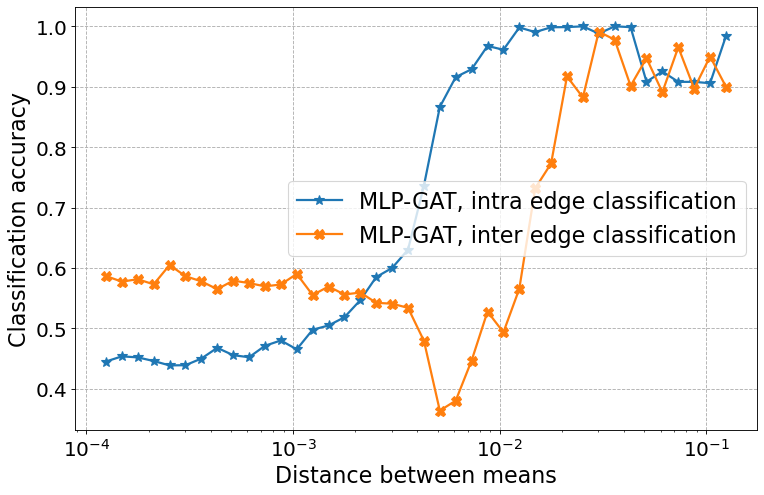

Class:  2
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.1
GCN,     Loss: 0.3774559612252882 | Train: 1.0000 | Test: 0.5300
Linear,  Loss: 0.2463200962437051 | Train: 1.0000 | Test: 0.4590
MLP GAT, Loss: 0.2 | Train: 1.0000 | Test: 0.6610
Head:  0  acc intra edges:  0.46013933420181274  acc inter edges:  0.49418604373931885
GAT,     Loss: 0.2 | Train: 0.9929 | Test: 0.6330
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.2
GCN,     Loss: 0.3736301310360431 | Train: 1.0000 | Test: 0.5250
Linear,  Loss: 0.2457442676914590 | Train: 1.0000 | Test: 0.4530
MLP GAT, Loss: 0.2 | Train: 0.9929 | Test: 0.6720
Head:  0  acc intra edges:  0.4658668637275696  acc inter edges:  0.4738371968269348
GAT,     Loss: 0.2 | Train: 1.0000 | Test: 0.6110
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.3
GCN,     Loss: 0.3749863080680370 | Train: 1.0000 | Test: 0.4990
Linear,  Loss: 0.246007177020822

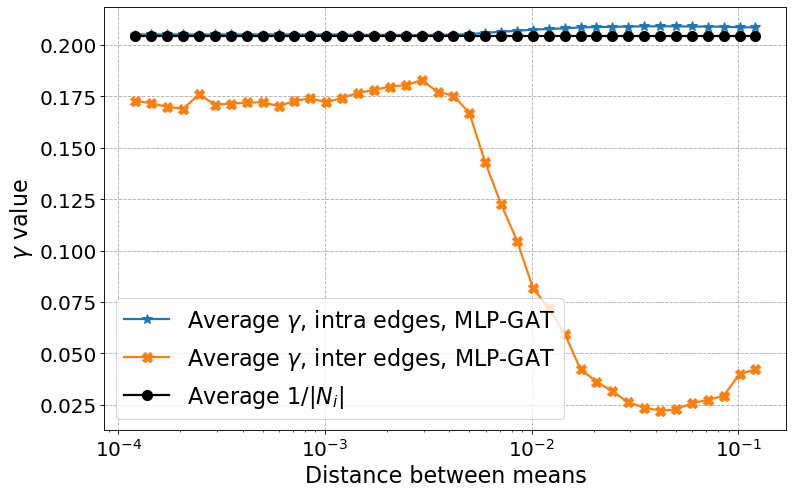

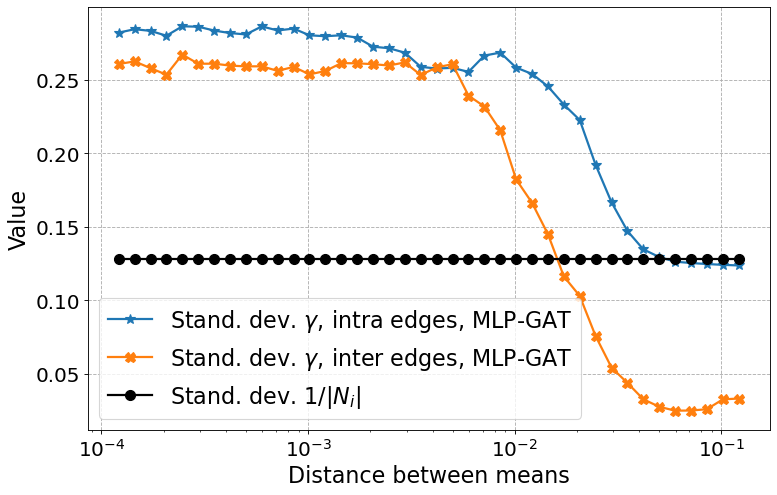

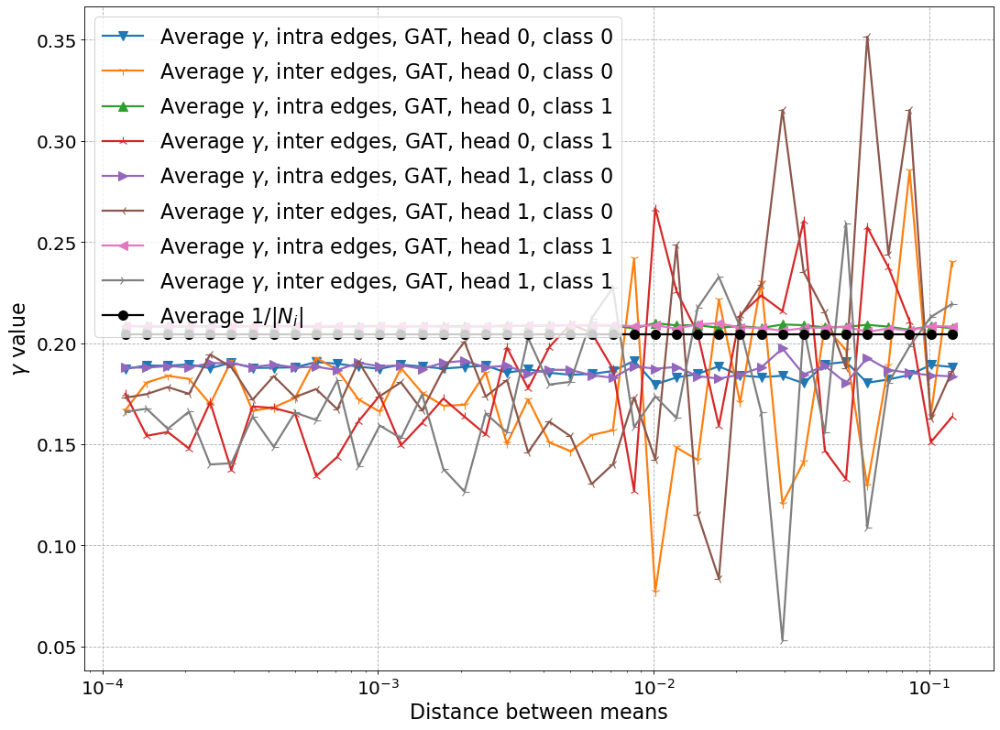

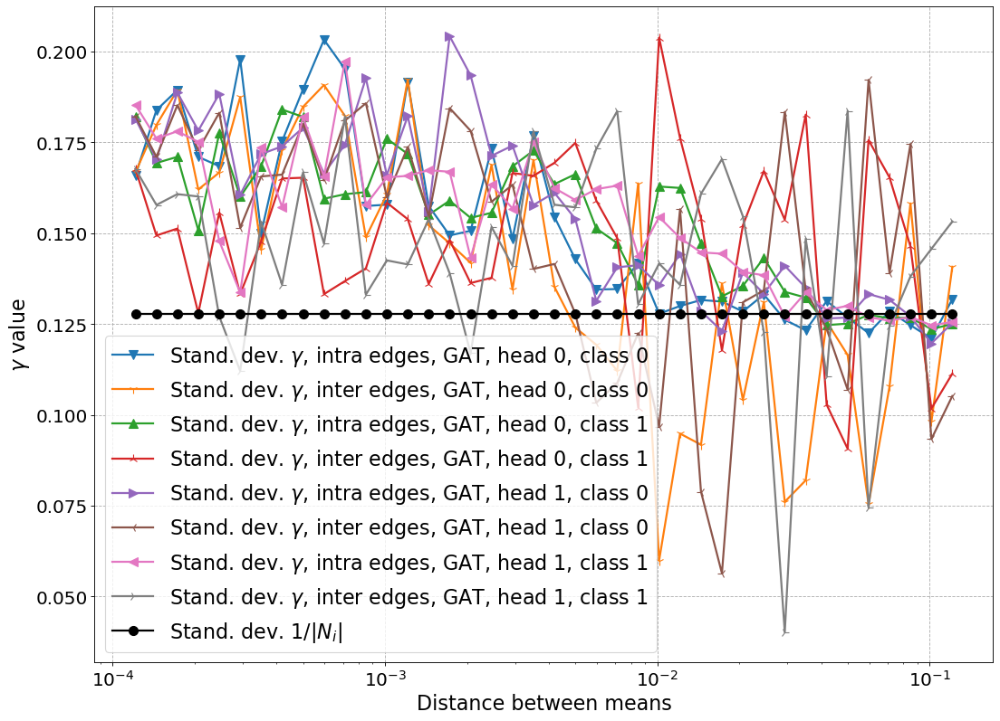

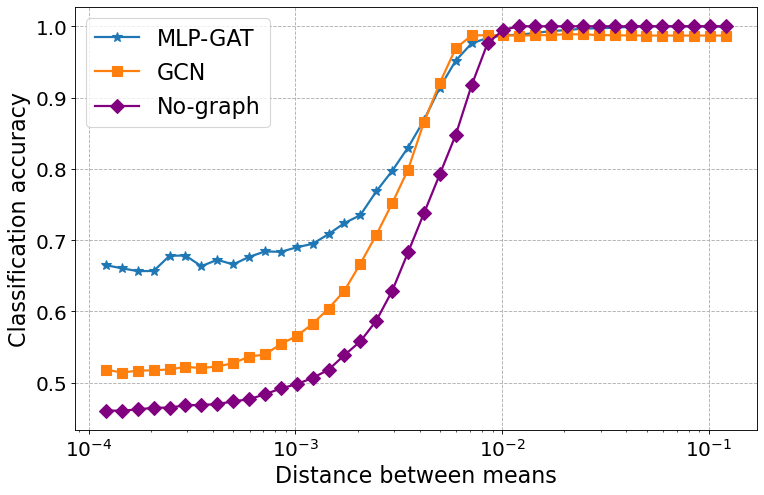

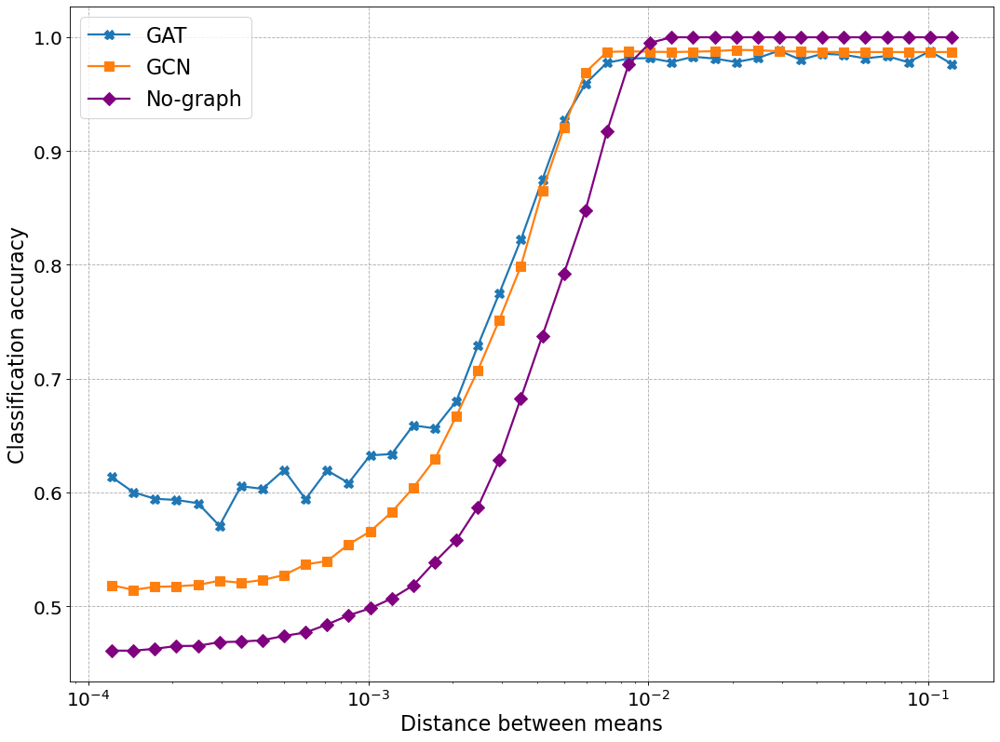

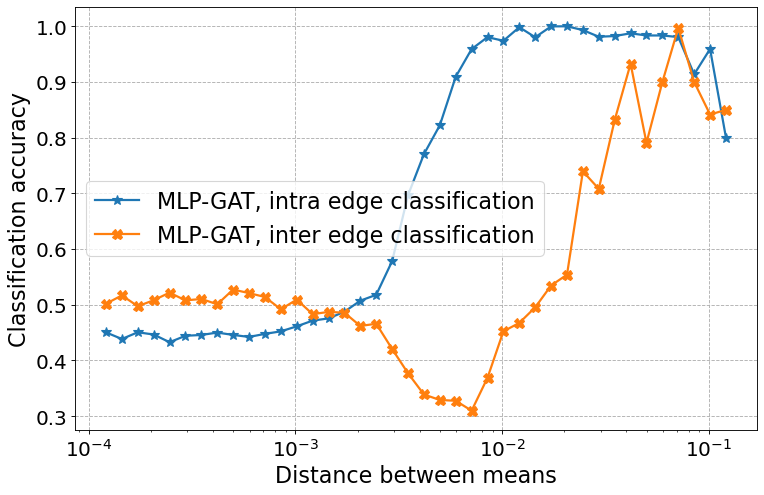

Class:  3
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.1
GCN,     Loss: 0.3915681711531111 | Train: 0.9929 | Test: 0.5160
Linear,  Loss: 0.2452824159924473 | Train: 1.0000 | Test: 0.4920
MLP GAT, Loss: 0.2 | Train: 0.9786 | Test: 0.6220
Head:  0  acc intra edges:  0.4374185800552368  acc inter edges:  0.5850410461425781
GAT,     Loss: 0.3 | Train: 1.0000 | Test: 0.5910
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.2
GCN,     Loss: 0.3876822146720120 | Train: 0.9929 | Test: 0.5250
Linear,  Loss: 0.2459524375519582 | Train: 1.0000 | Test: 0.4940
MLP GAT, Loss: 0.2 | Train: 0.9929 | Test: 0.6180
Head:  0  acc intra edges:  0.4471028447151184  acc inter edges:  0.5584017038345337
GAT,     Loss: 0.2 | Train: 0.9929 | Test: 0.5850
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.3
GCN,     Loss: 0.3878840023917811 | Train: 0.9929 | Test: 0.5190
Linear,  Loss: 0.2465761582234076 

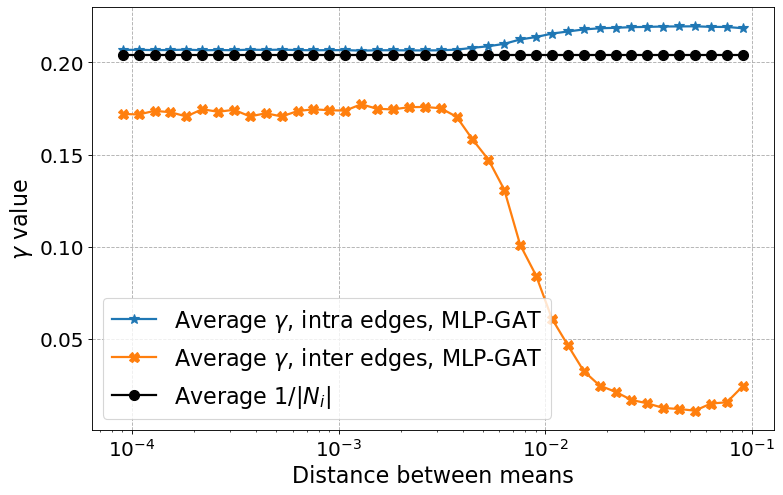

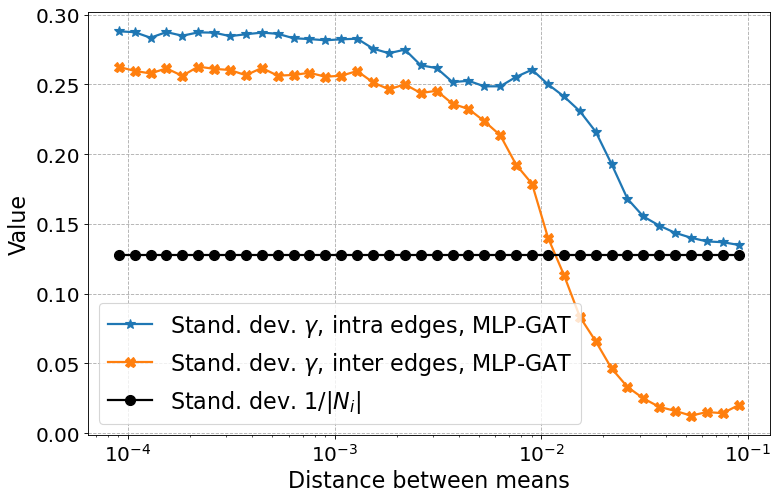

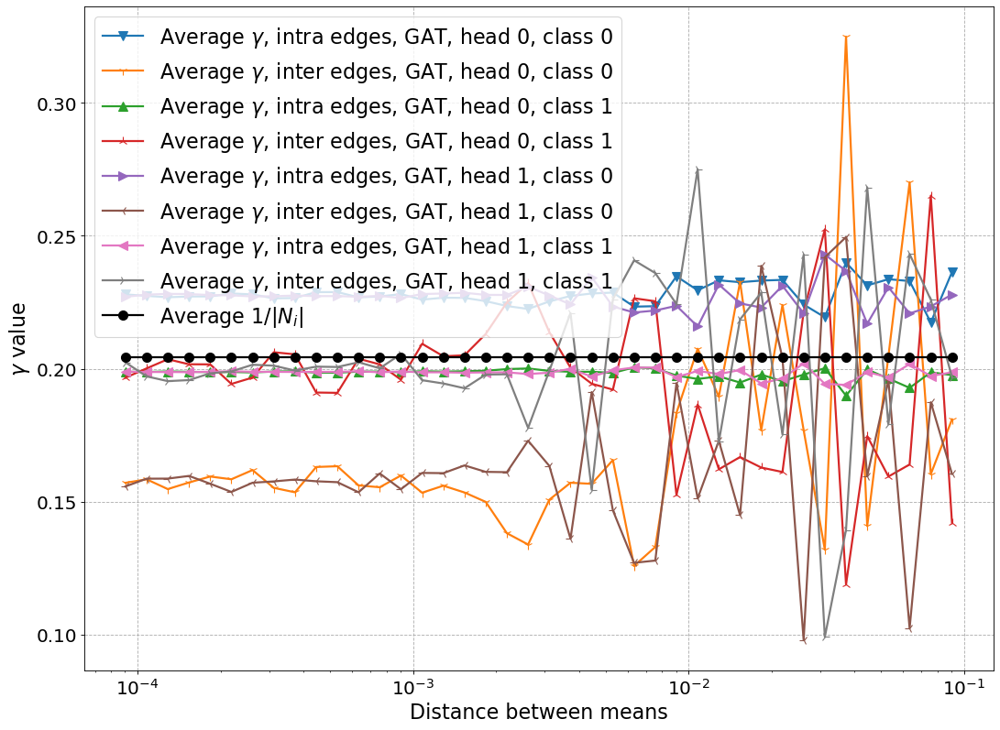

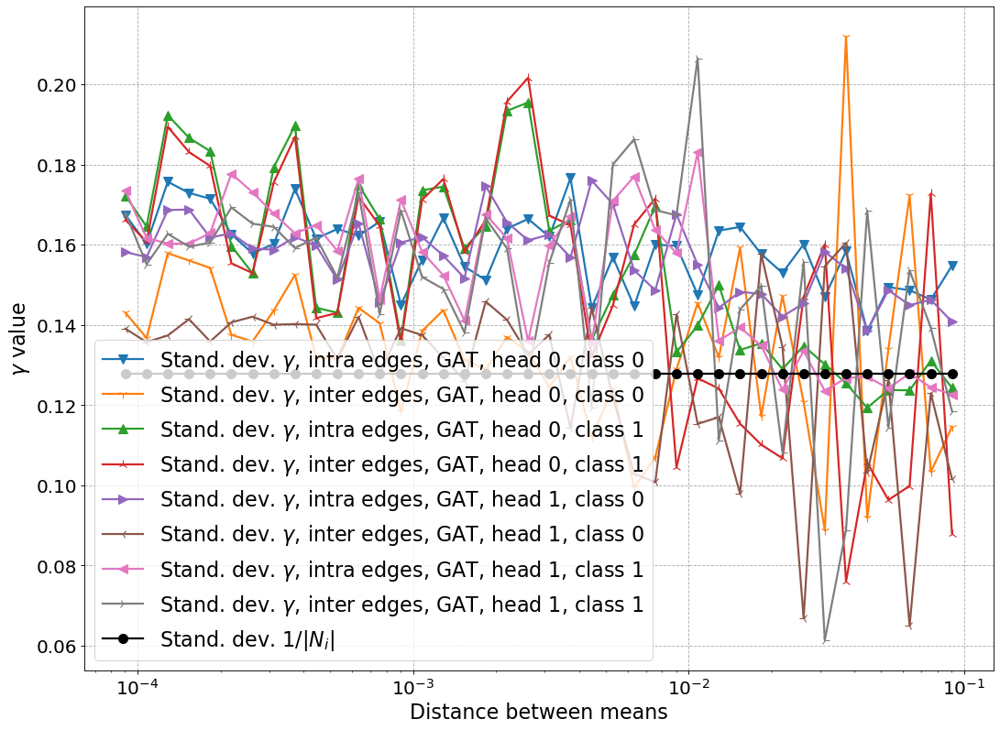

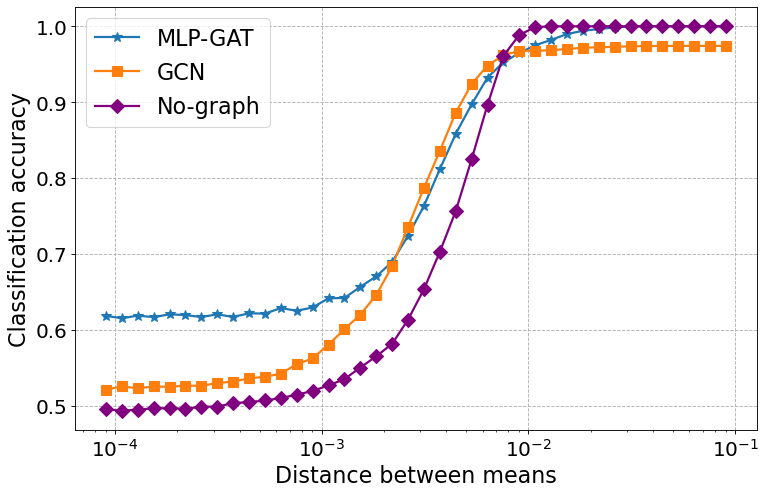

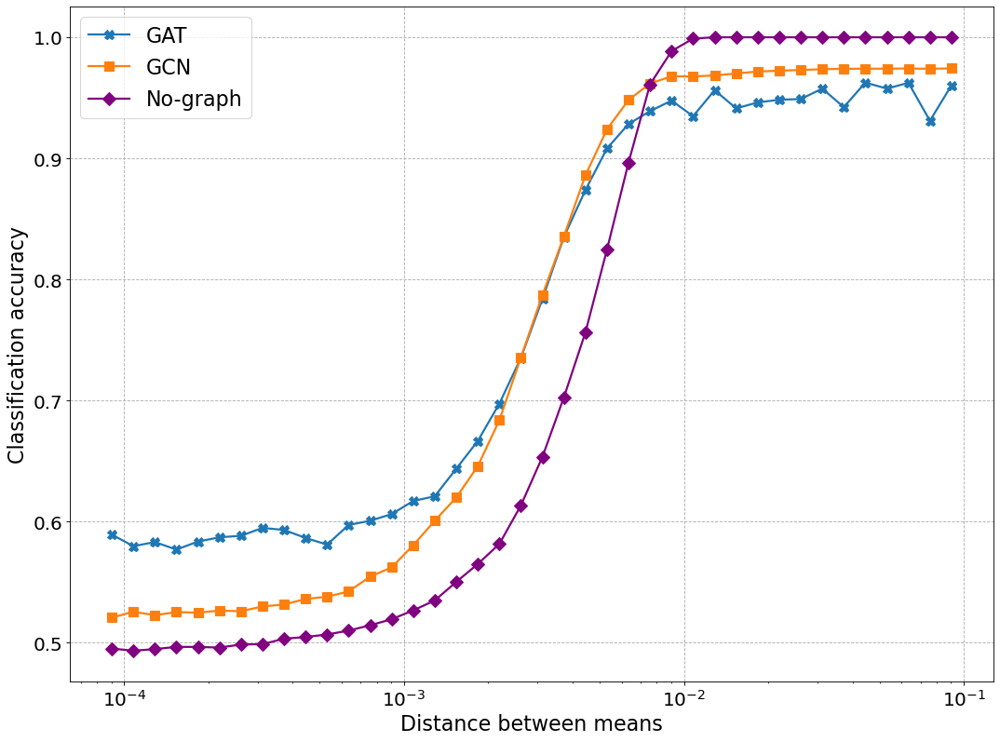

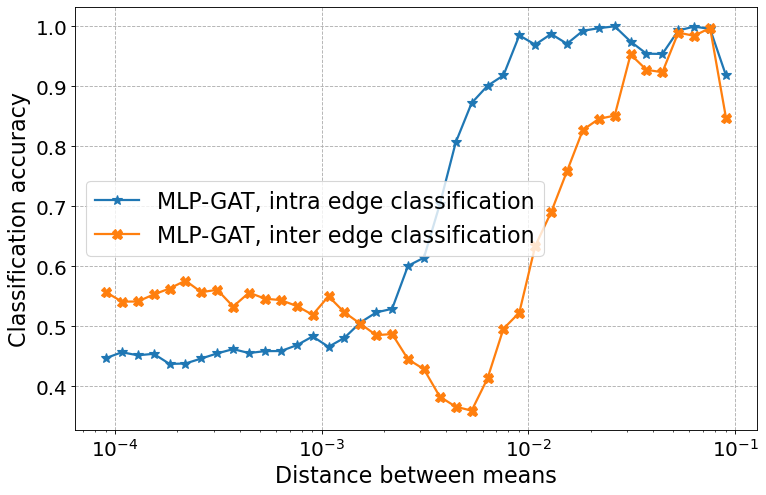

Class:  4
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.1
GCN,     Loss: 0.3753629227834088 | Train: 0.9929 | Test: 0.5030
Linear,  Loss: 0.2489638006048543 | Train: 1.0000 | Test: 0.4850
MLP GAT, Loss: 0.2 | Train: 0.9929 | Test: 0.7070
Head:  0  acc intra edges:  0.4405660629272461  acc inter edges:  0.6415441036224365
GAT,     Loss: 0.2 | Train: 0.9929 | Test: 0.6640
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.2
GCN,     Loss: 0.3796549953520298 | Train: 0.9929 | Test: 0.5050
Linear,  Loss: 0.2497199264488050 | Train: 1.0000 | Test: 0.4890
MLP GAT, Loss: 0.2 | Train: 0.9929 | Test: 0.7020
Head:  0  acc intra edges:  0.43718552589416504  acc inter edges:  0.6691176891326904
GAT,     Loss: 0.3 | Train: 0.9929 | Test: 0.5430
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.3
GCN,     Loss: 0.3750569838498320 | Train: 1.0000 | Test: 0.5060
Linear,  Loss: 0.2488259682165725

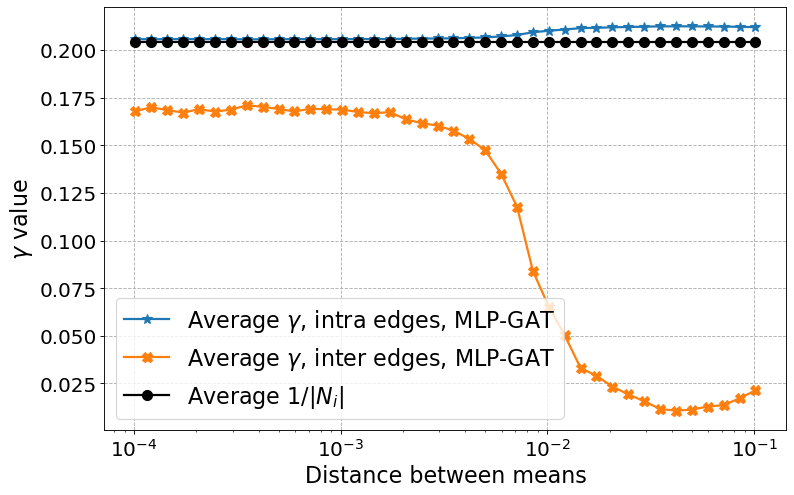

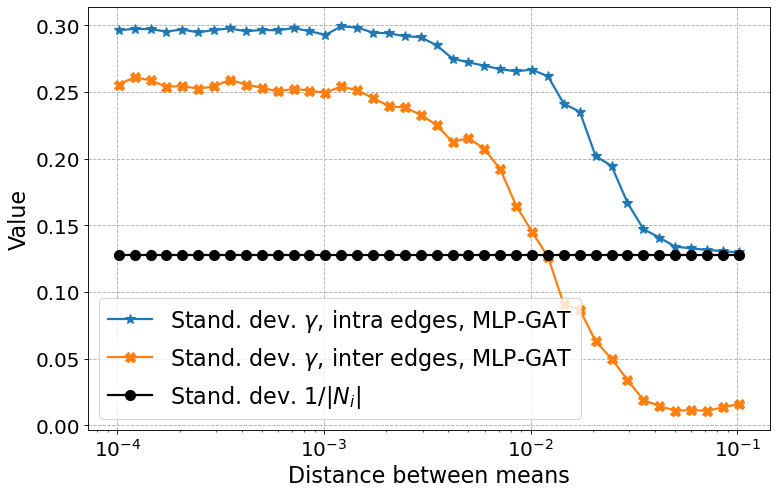

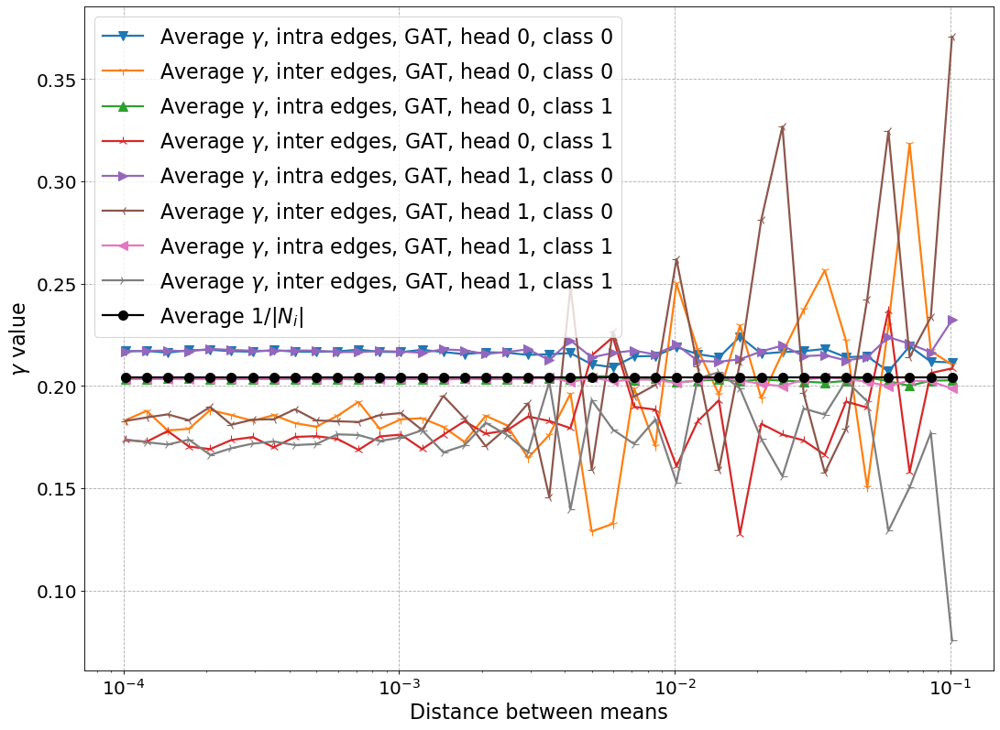

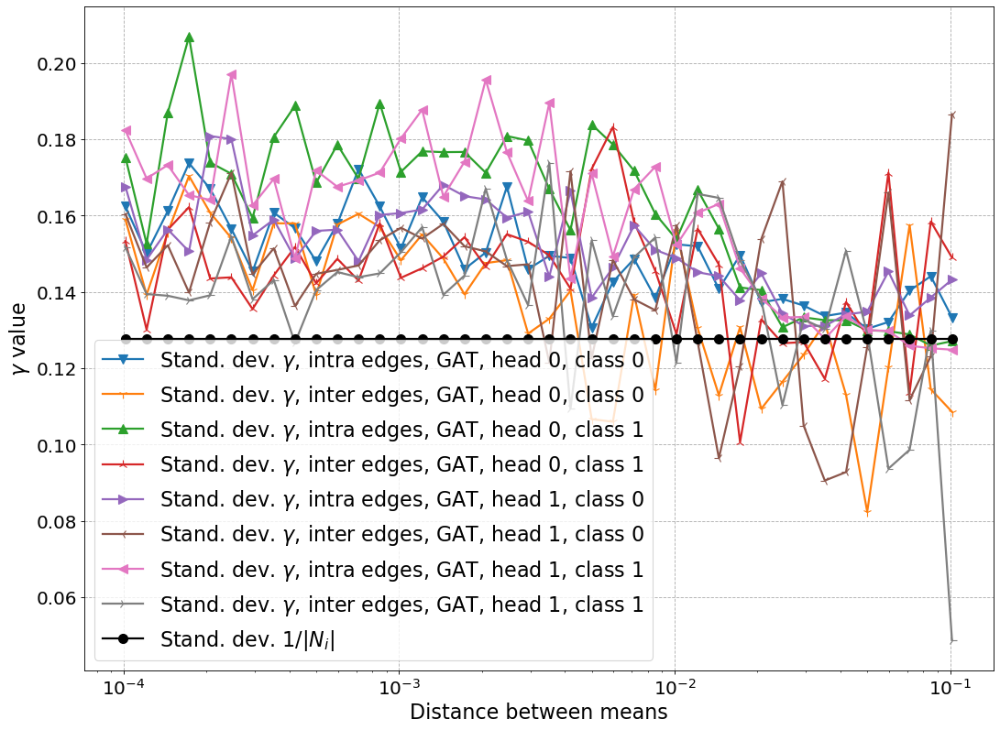

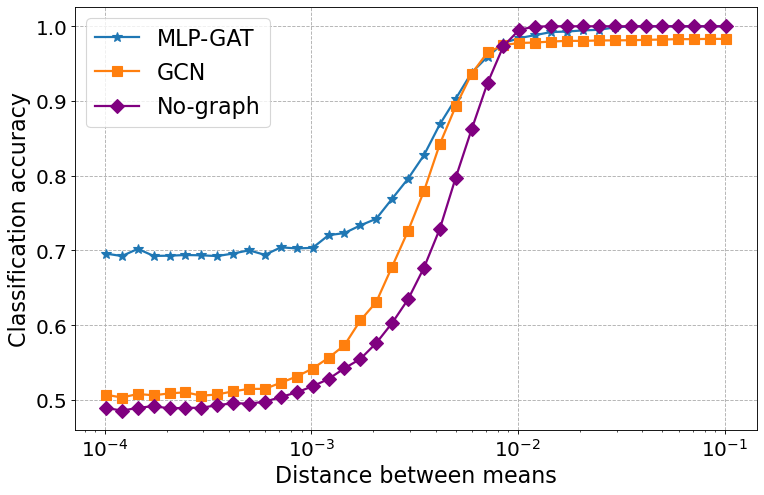

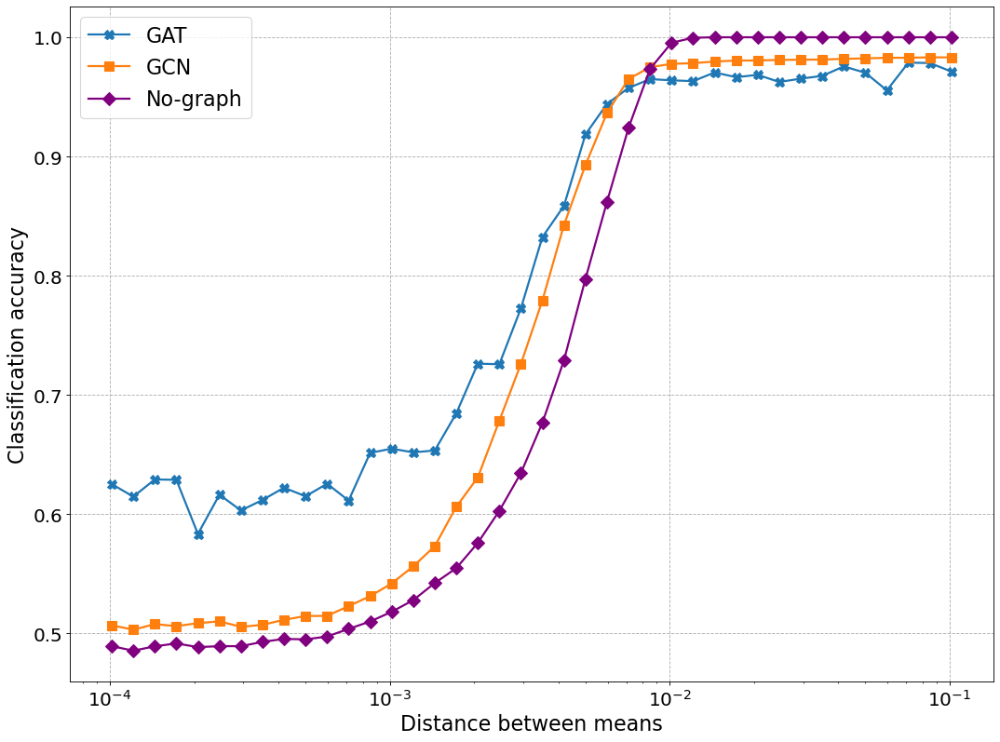

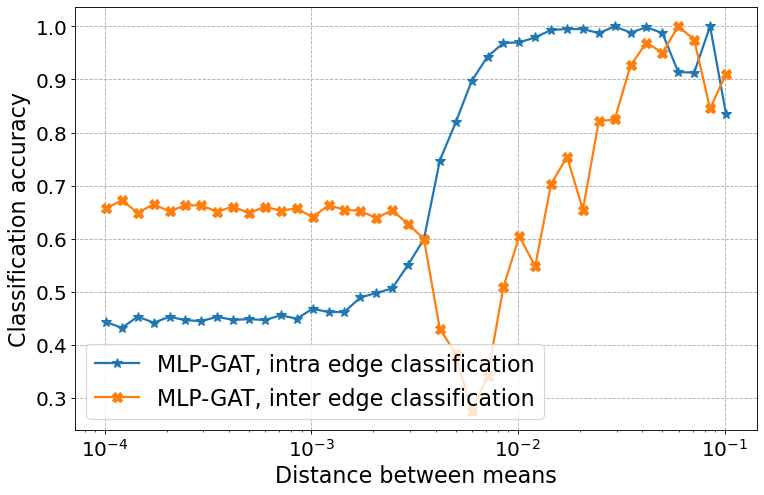

Class:  5
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.1
GCN,     Loss: 0.3751049039087125 | Train: 1.0000 | Test: 0.5140
Linear,  Loss: 0.2517416516585009 | Train: 1.0000 | Test: 0.4750
MLP GAT, Loss: 0.2 | Train: 1.0000 | Test: 0.7230
Head:  0  acc intra edges:  0.445141077041626  acc inter edges:  0.567460298538208
GAT,     Loss: 0.3 | Train: 0.9929 | Test: 0.5500
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.2
GCN,     Loss: 0.3776703262967723 | Train: 1.0000 | Test: 0.5070
Linear,  Loss: 0.2509840637977634 | Train: 0.9929 | Test: 0.4820
MLP GAT, Loss: 0.2 | Train: 1.0000 | Test: 0.6840
Head:  0  acc intra edges:  0.4294670820236206  acc inter edges:  0.557539701461792
GAT,     Loss: 0.4 | Train: 0.9929 | Test: 0.5400
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.3
GCN,     Loss: 0.3755696752241680 | Train: 1.0000 | Test: 0.5110
Linear,  Loss: 0.2533755296575171 | T

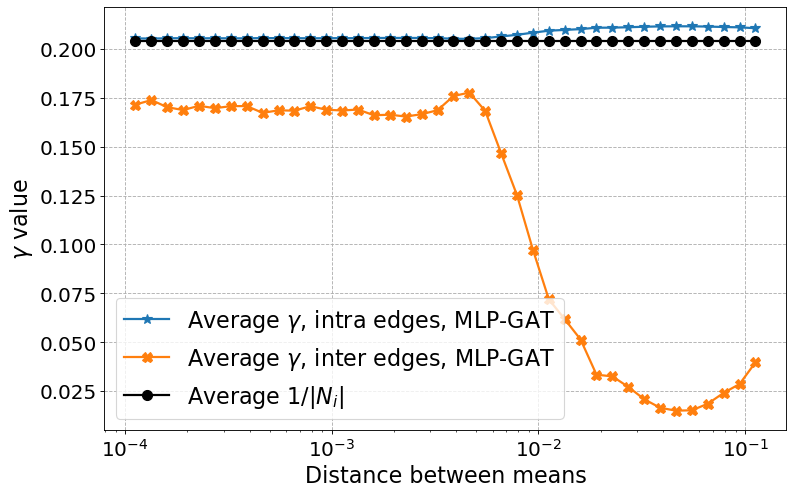

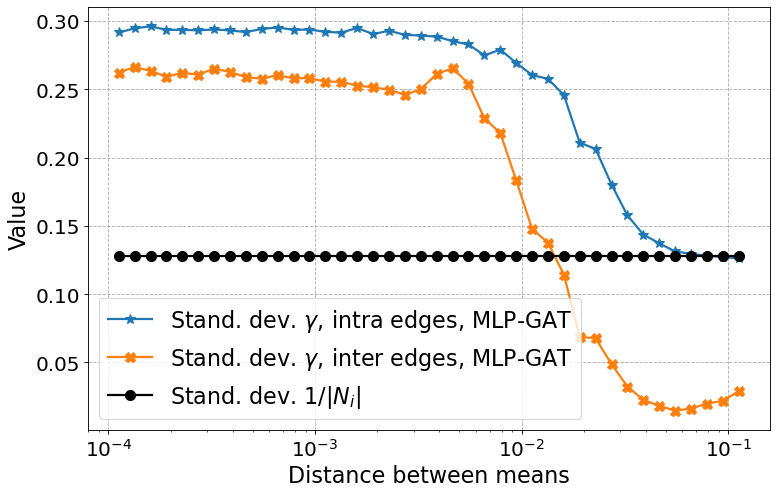

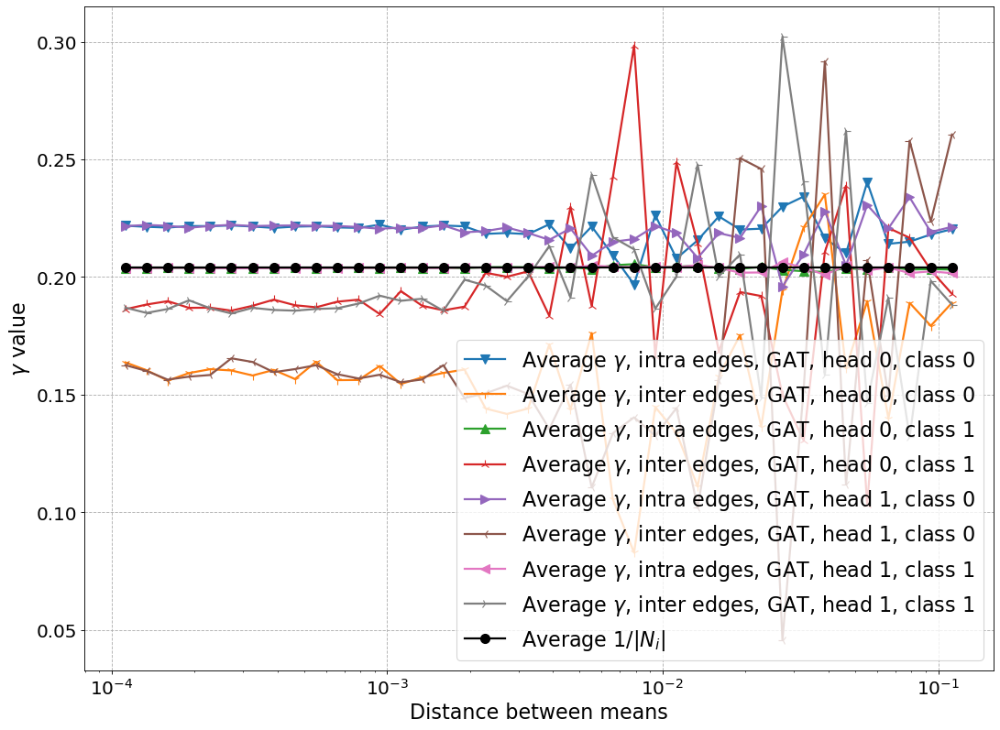

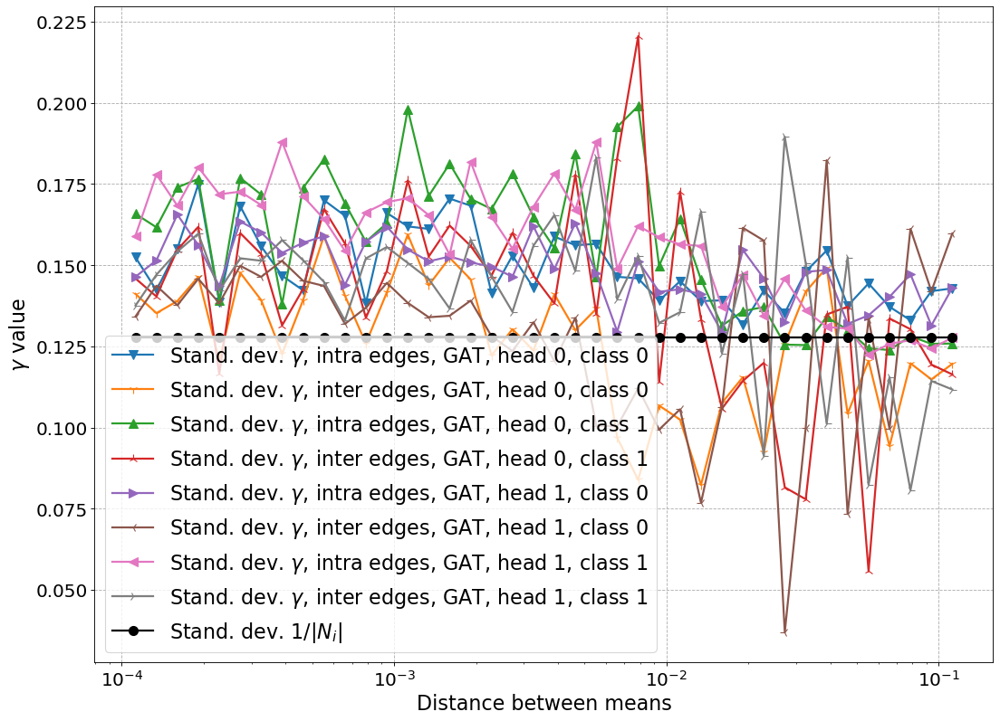

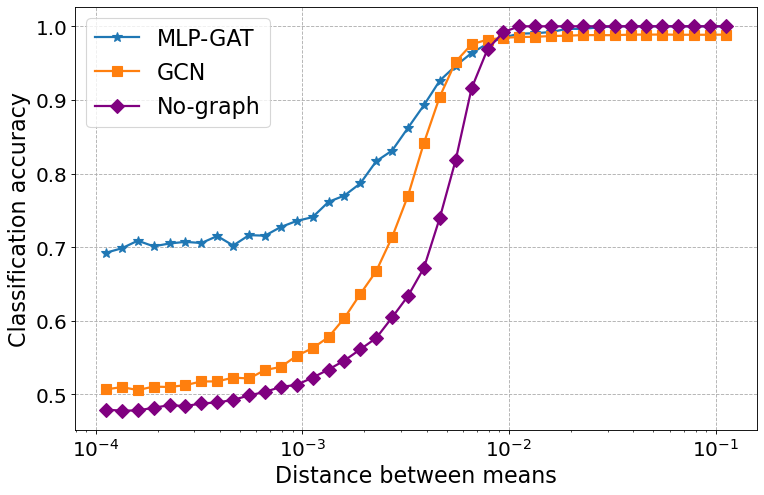

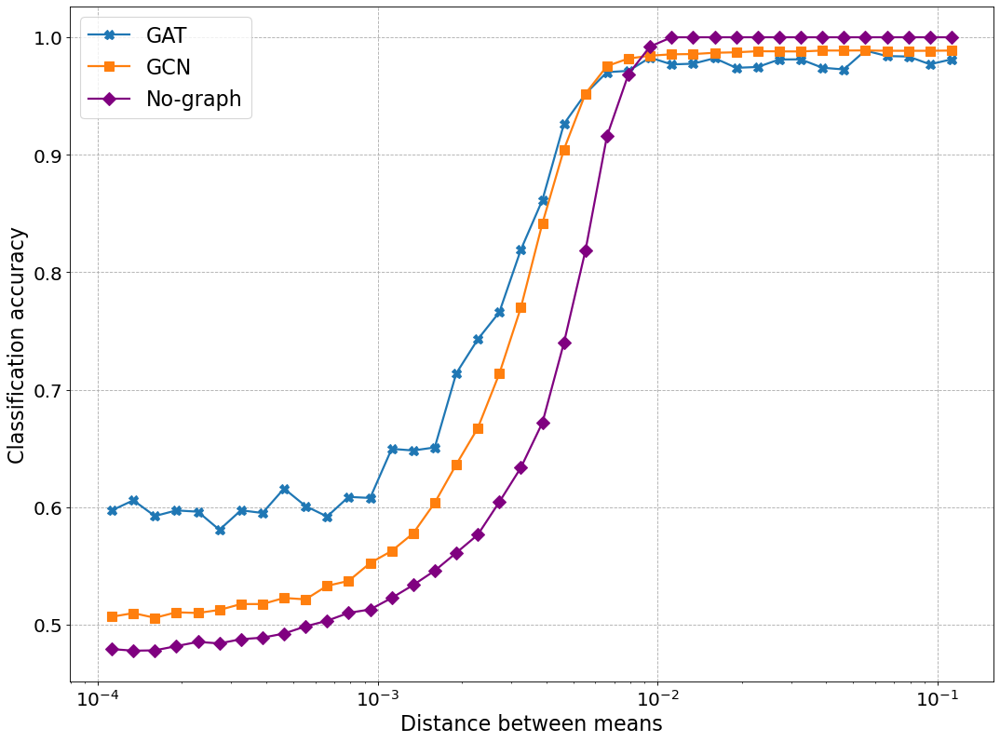

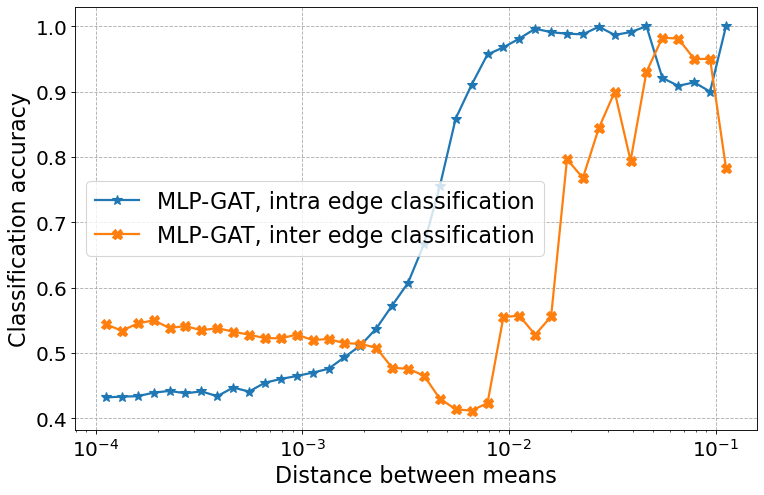

Class:  6
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.1
GCN,     Loss: 0.3711195000580379 | Train: 1.0000 | Test: 0.4880
Linear,  Loss: 0.2494527530457292 | Train: 1.0000 | Test: 0.4650
MLP GAT, Loss: 0.2 | Train: 0.9929 | Test: 0.7530
Head:  0  acc intra edges:  0.4480709433555603  acc inter edges:  0.5592105388641357
GAT,     Loss: 0.3 | Train: 0.9857 | Test: 0.6190
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.2
GCN,     Loss: 0.3694053944732462 | Train: 1.0000 | Test: 0.4940
Linear,  Loss: 0.2511814237173114 | Train: 1.0000 | Test: 0.4770
MLP GAT, Loss: 0.2 | Train: 1.0000 | Test: 0.7130
Head:  0  acc intra edges:  0.48510801792144775  acc inter edges:  0.5625
GAT,     Loss: 0.2 | Train: 0.9929 | Test: 0.6690
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.3
GCN,     Loss: 0.3660800026995795 | Train: 1.0000 | Test: 0.5020
Linear,  Loss: 0.2497008719082389 | Train: 1.

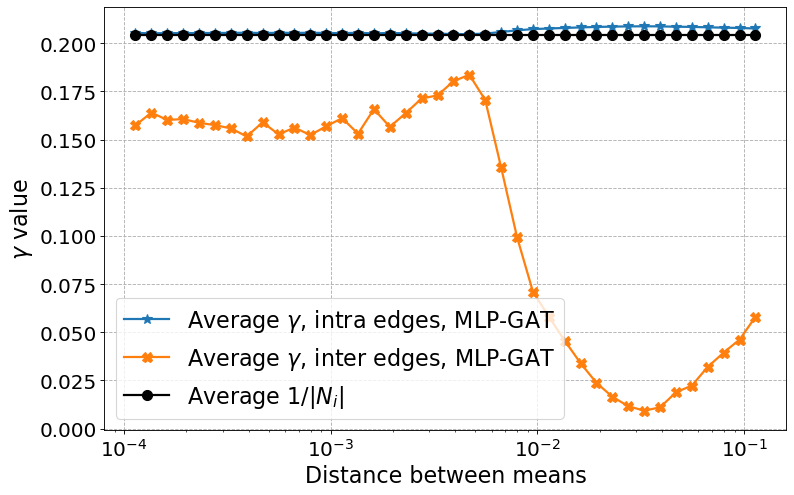

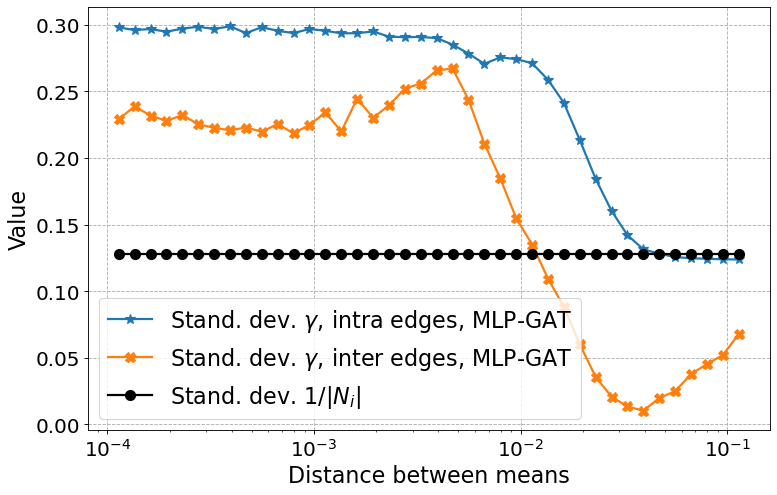

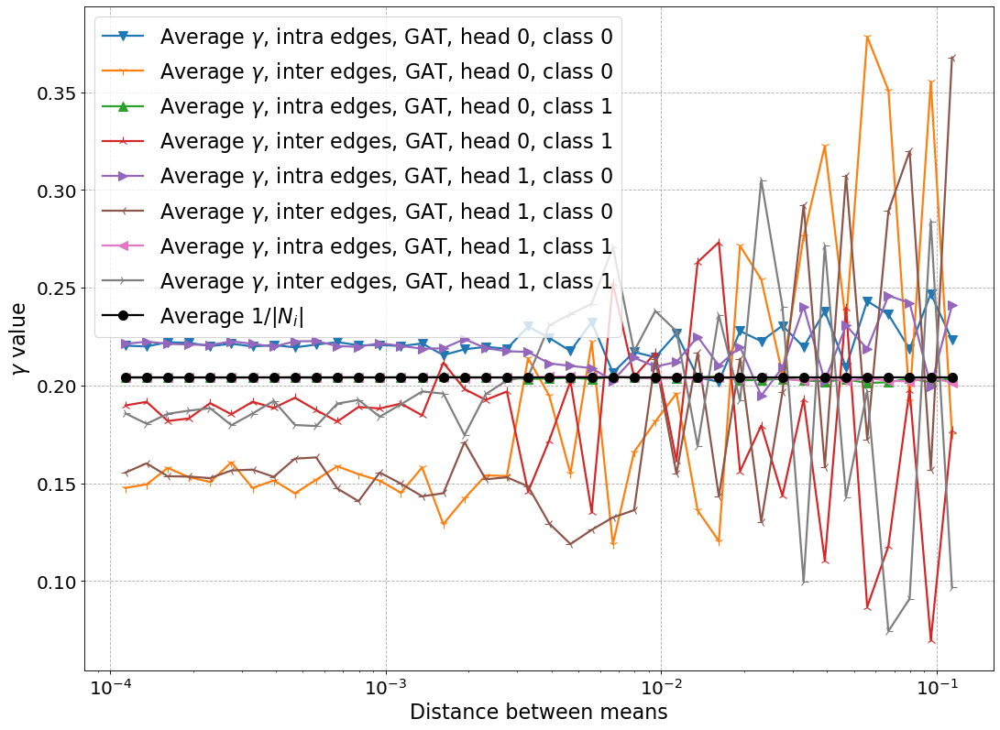

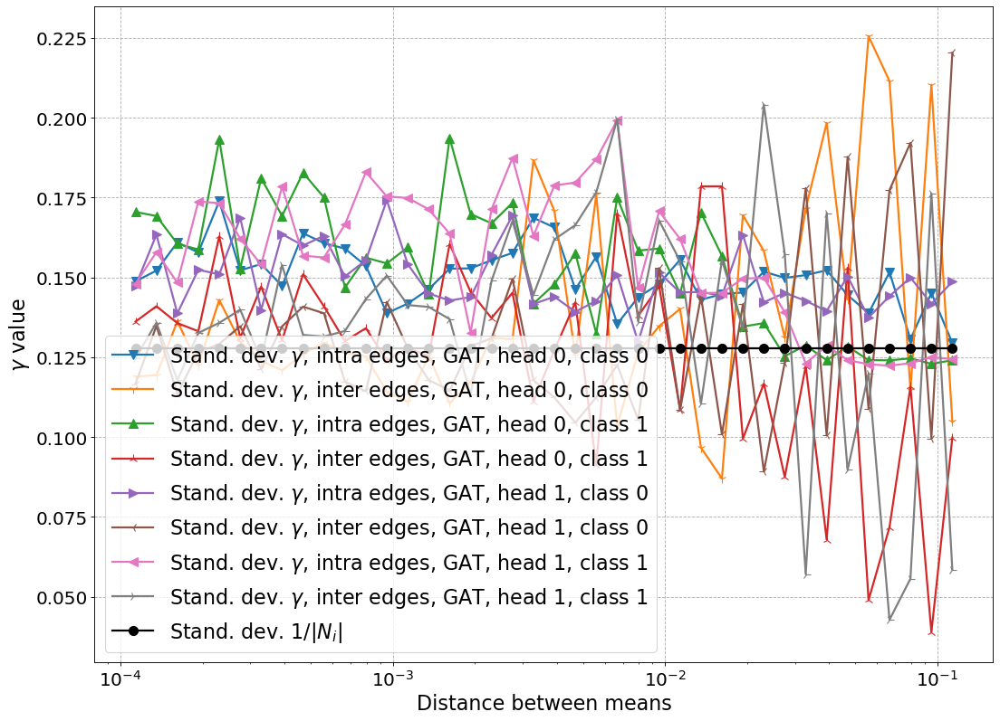

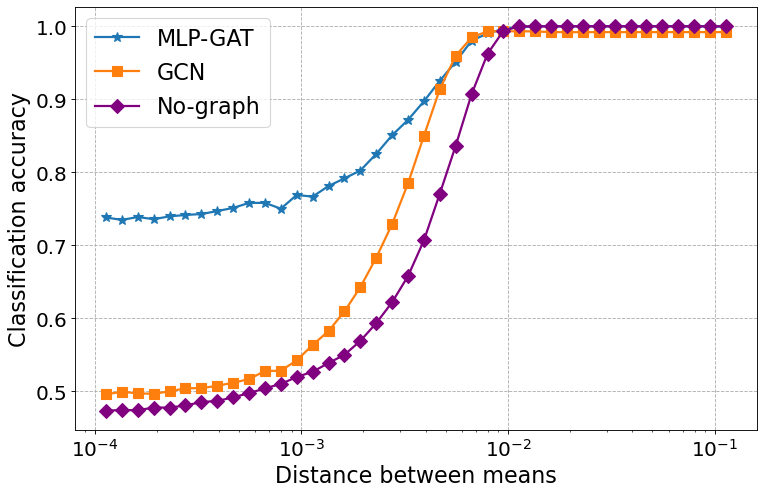

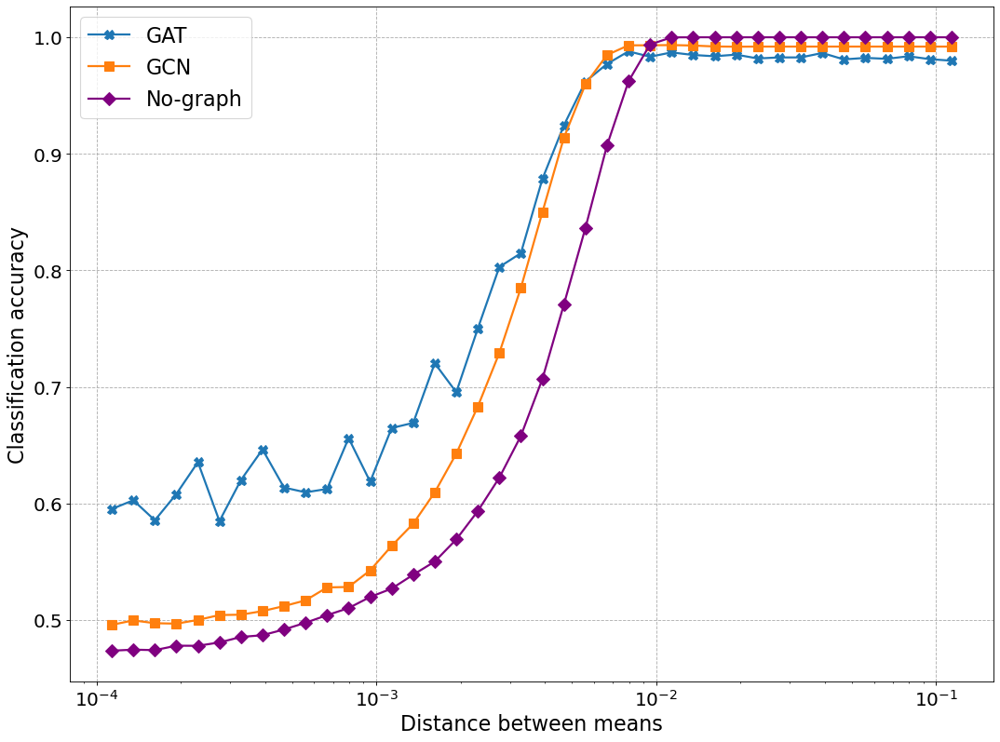

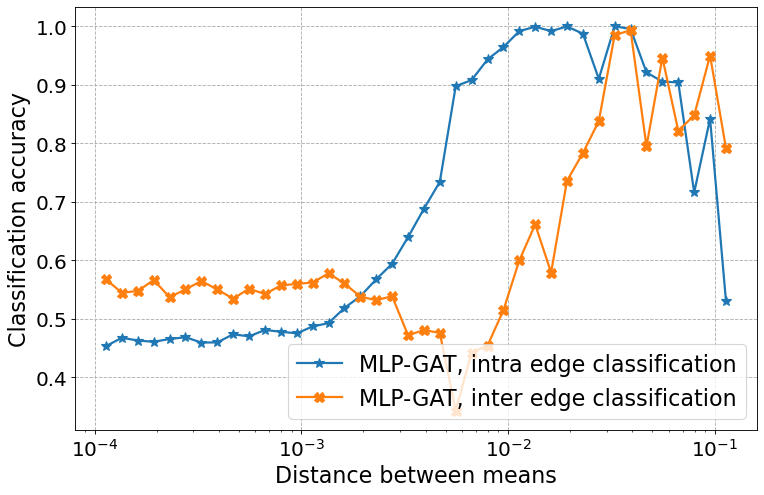

PubMed
Number of classes:  tensor(3, device='cuda:0')
Class:  0
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.1
GCN,     Loss: 0.6544715614989400 | Train: 0.9833 | Test: 0.5240
Linear,  Loss: 0.6262288520733515 | Train: 1.0000 | Test: 0.4610
MLP GAT, Loss: 0.6 | Train: 0.9667 | Test: 0.5680
Head:  0  acc intra edges:  0.7921846508979797  acc inter edges:  0.2549128532409668
GAT,     Loss: 0.6 | Train: 0.9667 | Test: 0.5720
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.2
GCN,     Loss: 0.6521148669222990 | Train: 0.9833 | Test: 0.5240
Linear,  Loss: 0.6250837554534276 | Train: 1.0000 | Test: 0.4660
MLP GAT, Loss: 0.6 | Train: 0.9833 | Test: 0.5490
Head:  0  acc intra edges:  0.5148242115974426  acc inter edges:  0.390619158744812
GAT,     Loss: 0.7 | Train: 0.9833 | Test: 0.5680
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.3
GCN,     Loss: 0.6534383652731777 | Train: 0.9

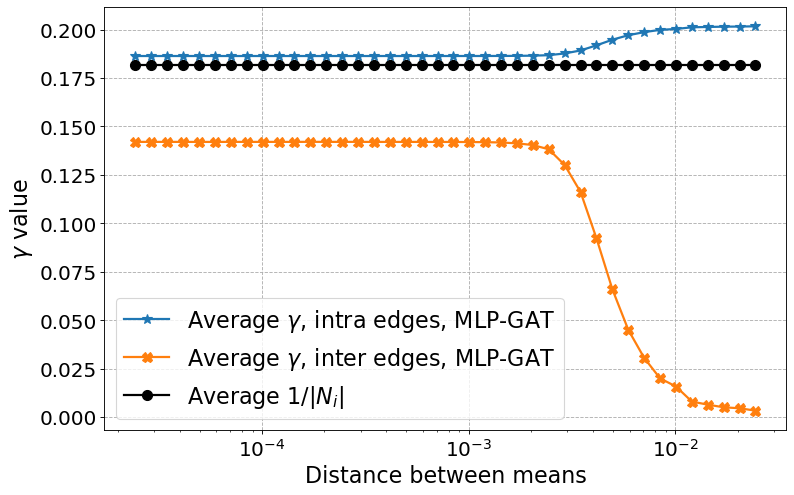

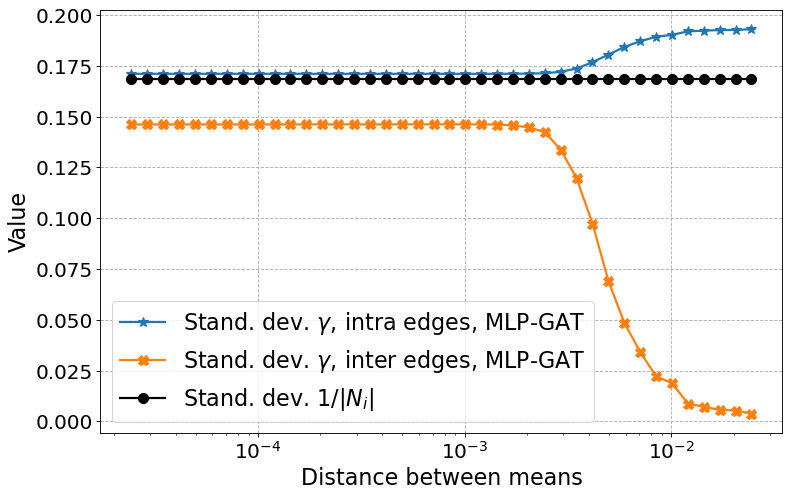

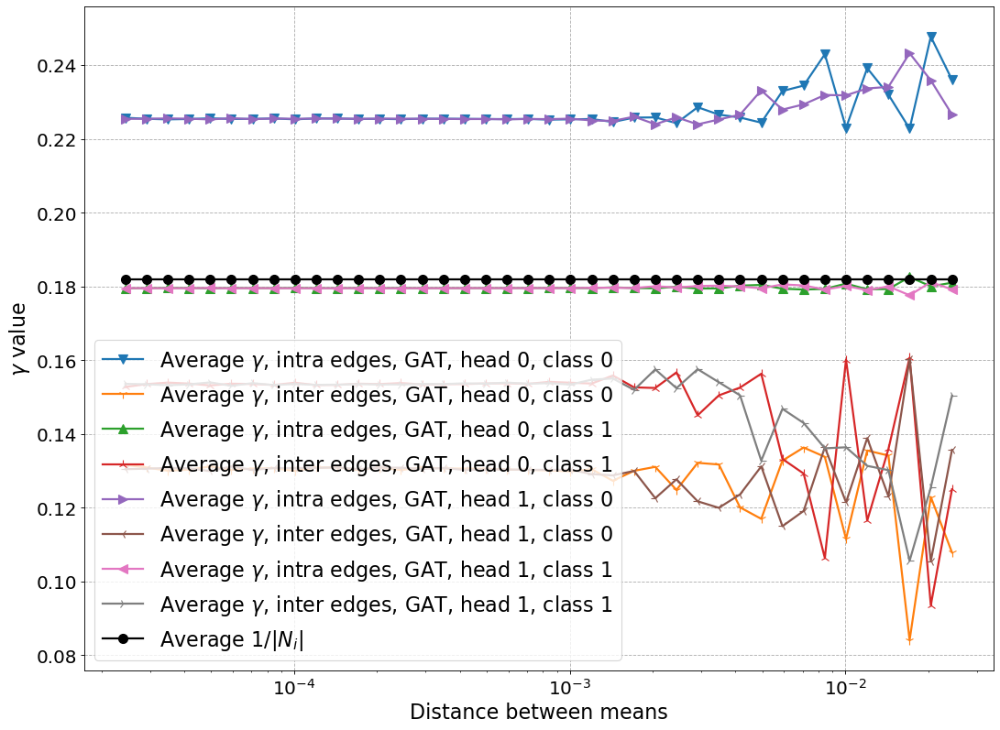

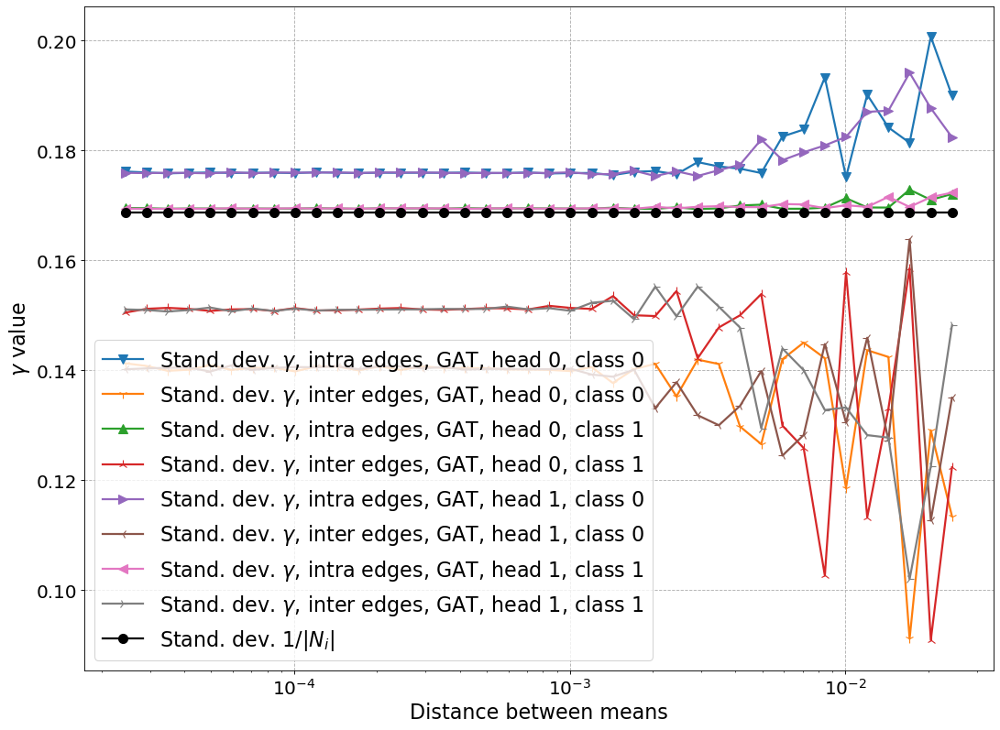

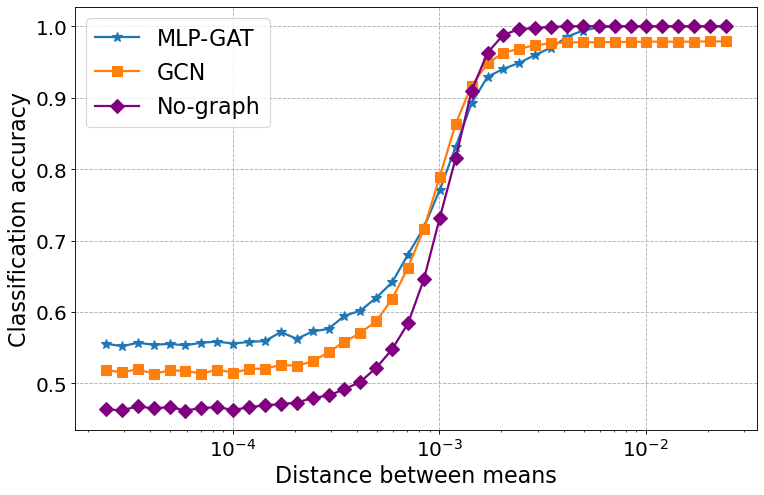

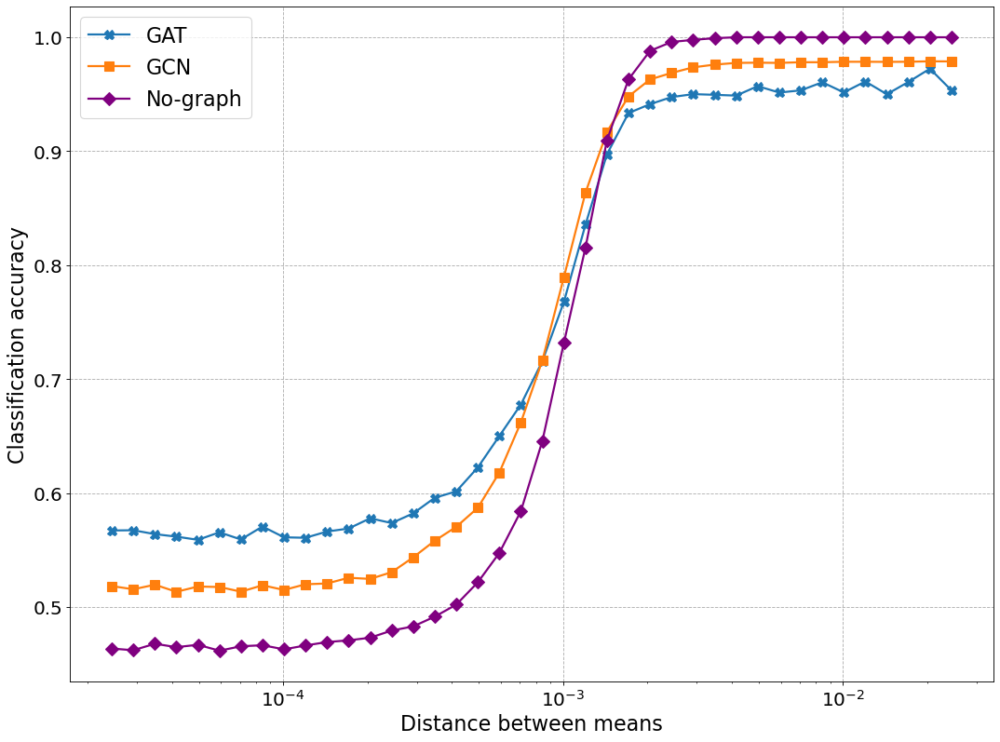

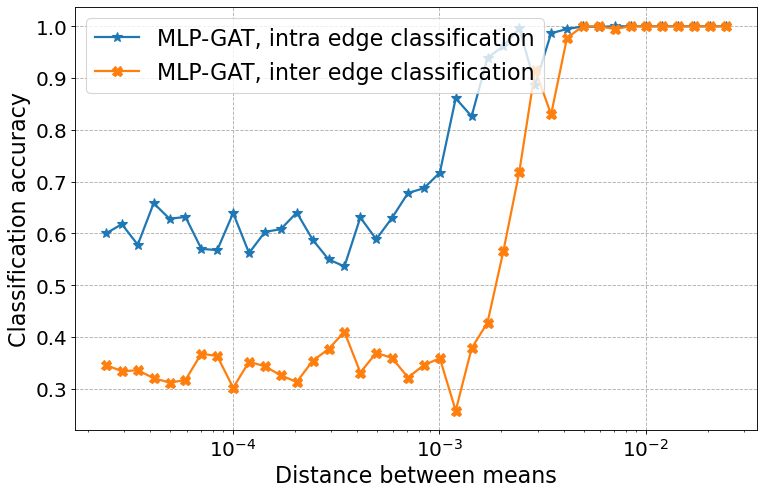

Class:  1
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.1
GCN,     Loss: 0.6520517955844601 | Train: 0.9667 | Test: 0.4930
Linear,  Loss: 0.6246092952943096 | Train: 0.9667 | Test: 0.4910
MLP GAT, Loss: 0.6 | Train: 0.9667 | Test: 0.5440
Head:  0  acc intra edges:  1.0  acc inter edges:  0.0
GAT,     Loss: 0.7 | Train: 0.9833 | Test: 0.5120
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.2
GCN,     Loss: 0.6503082464138666 | Train: 1.0000 | Test: 0.5090
Linear,  Loss: 0.6227574307471514 | Train: 0.9833 | Test: 0.4900
MLP GAT, Loss: 0.6 | Train: 0.9833 | Test: 0.5290
Head:  0  acc intra edges:  0.8648354411125183  acc inter edges:  0.1743793487548828
GAT,     Loss: 0.7 | Train: 1.0000 | Test: 0.5270
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.3
GCN,     Loss: 0.6496384371304884 | Train: 0.9667 | Test: 0.5070
Linear,  Loss: 0.6243048779666424 | Train: 0.9833 | Test: 0.4890

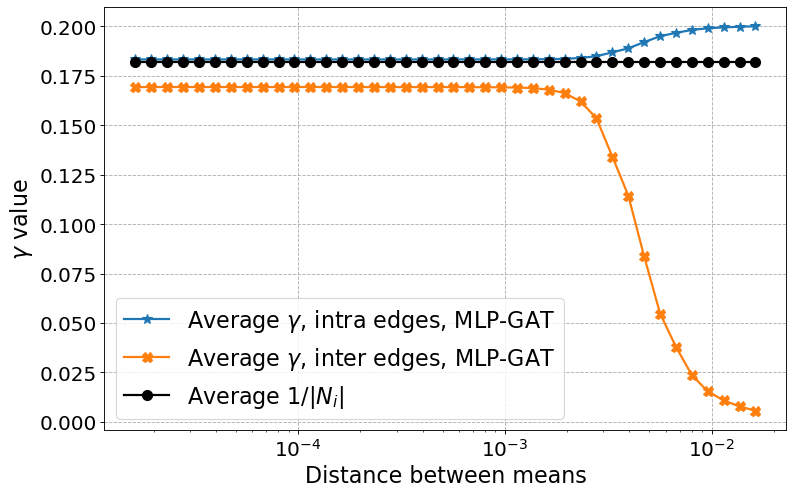

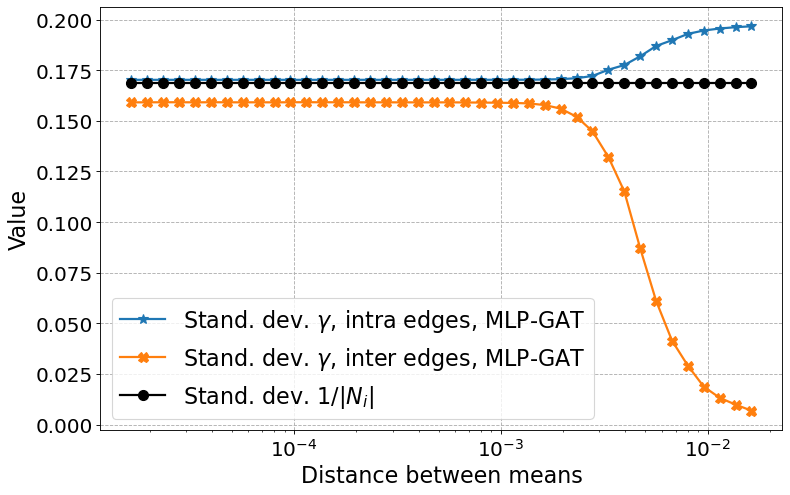

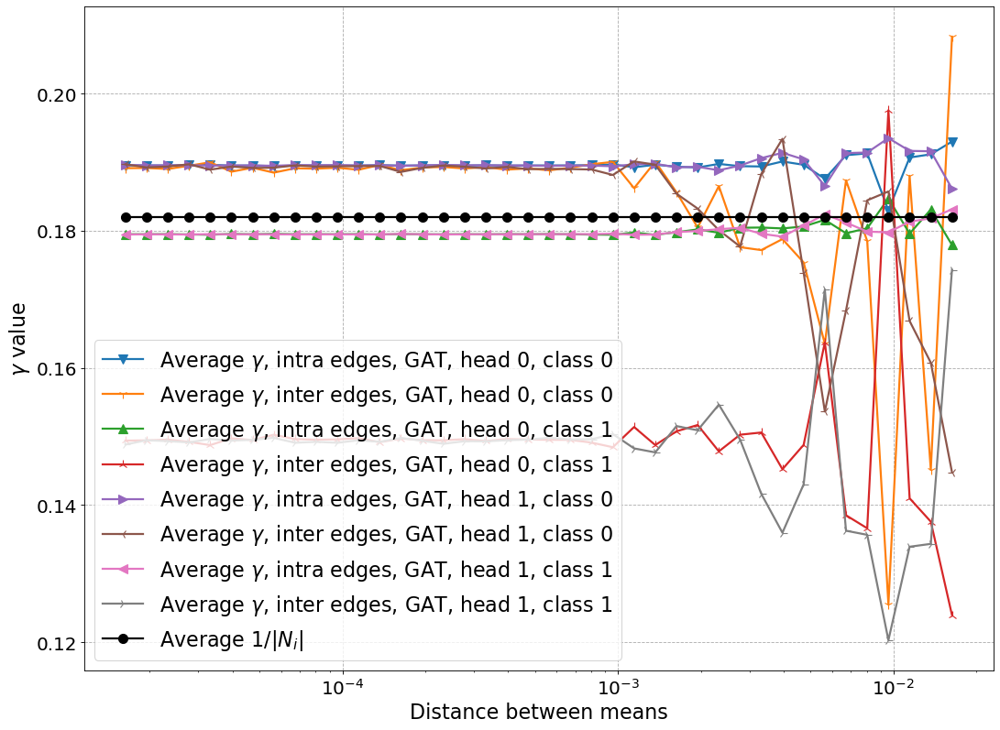

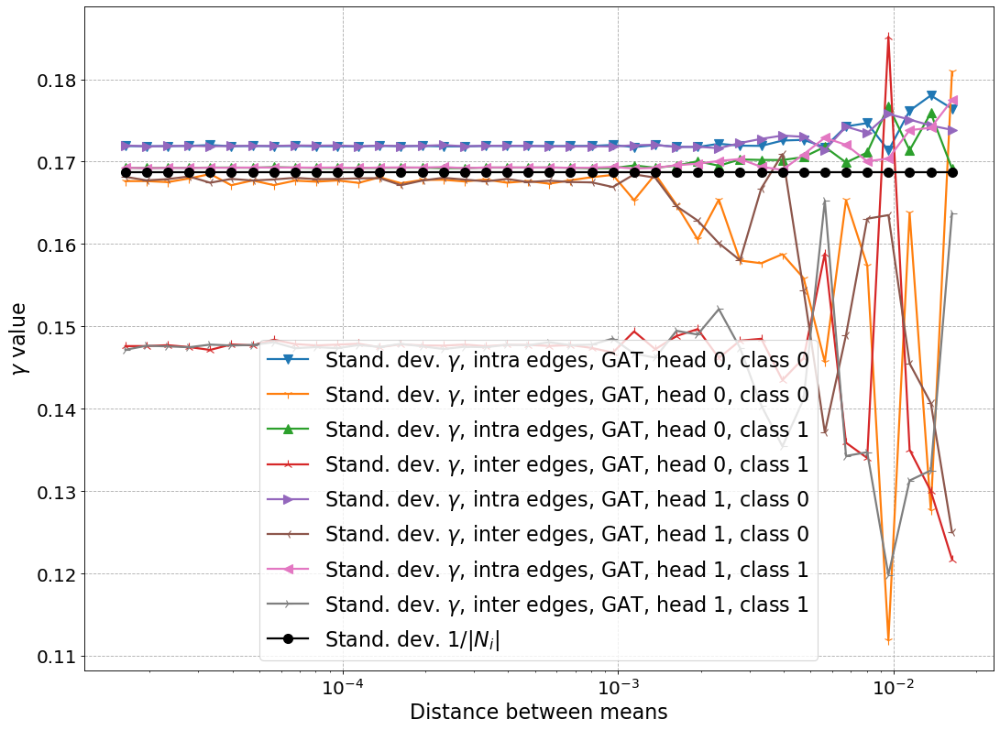

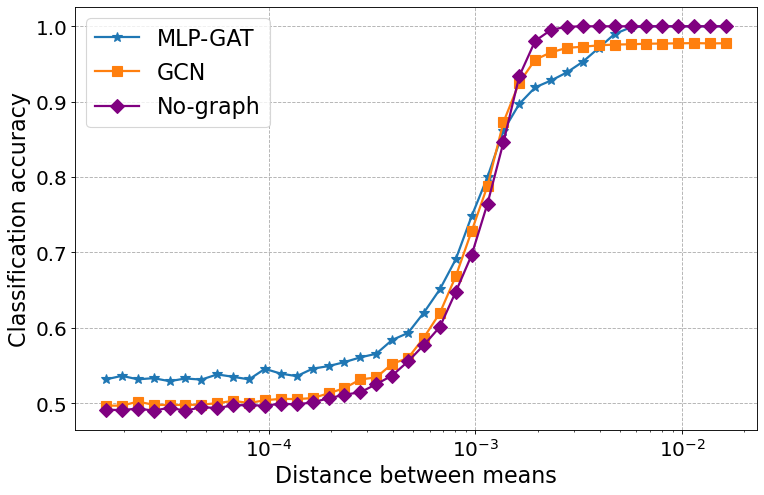

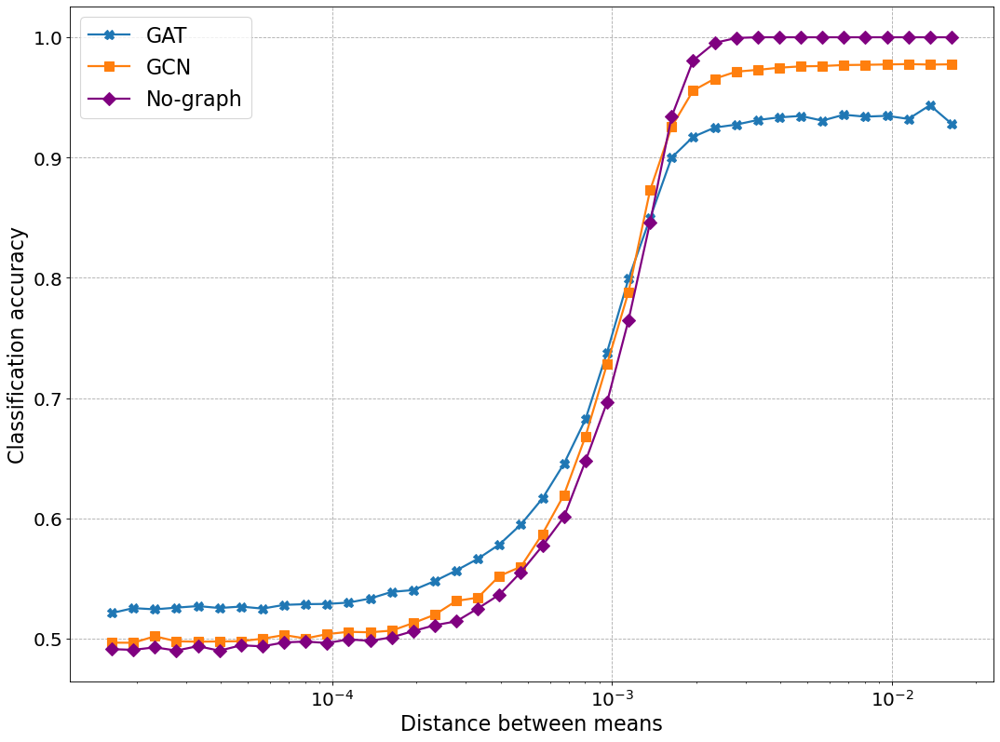

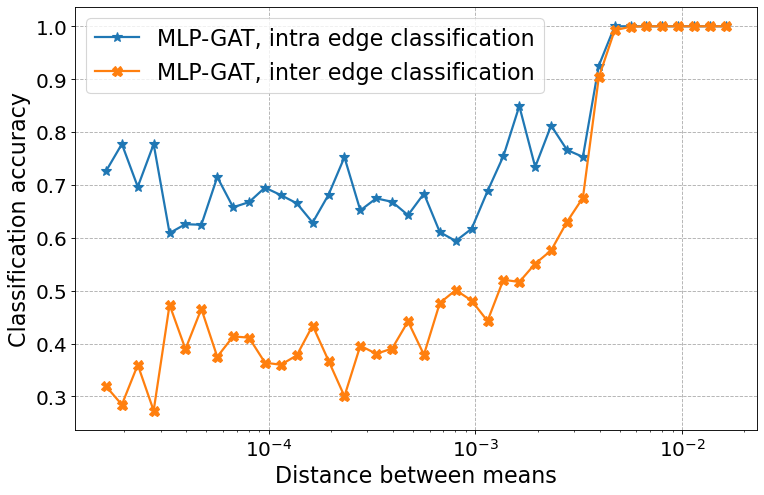

Class:  2
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.1
GCN,     Loss: 0.6443427593136827 | Train: 0.8667 | Test: 0.5060
Linear,  Loss: 0.6207612940110266 | Train: 0.9667 | Test: 0.4820
MLP GAT, Loss: 0.6 | Train: 0.9333 | Test: 0.5170
Head:  0  acc intra edges:  0.4062131643295288  acc inter edges:  0.5394272804260254
GAT,     Loss: 0.6 | Train: 0.9000 | Test: 0.5070
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.2
GCN,     Loss: 0.6420539770275354 | Train: 0.8833 | Test: 0.4960
Linear,  Loss: 0.6210137215287735 | Train: 0.9833 | Test: 0.4910
MLP GAT, Loss: 0.6 | Train: 0.9500 | Test: 0.5140
Head:  0  acc intra edges:  0.5060889720916748  acc inter edges:  0.4337000846862793
GAT,     Loss: 0.6 | Train: 0.9000 | Test: 0.5040
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.3
GCN,     Loss: 0.6459592386536921 | Train: 0.8500 | Test: 0.4990
Linear,  Loss: 0.6215975846629590 

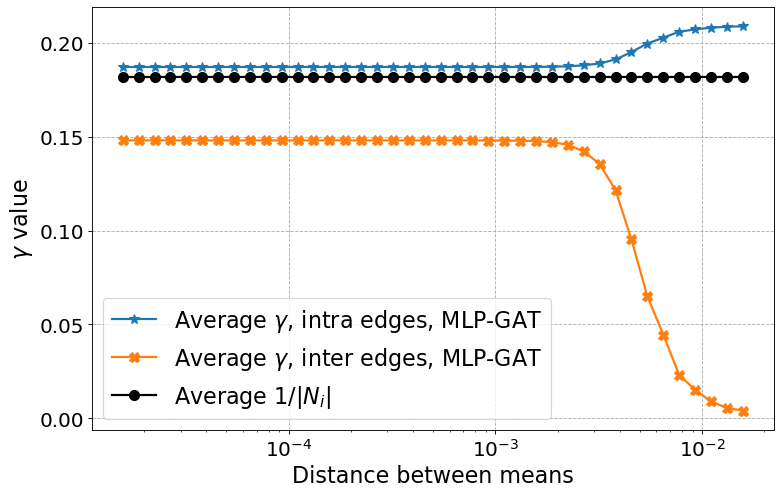

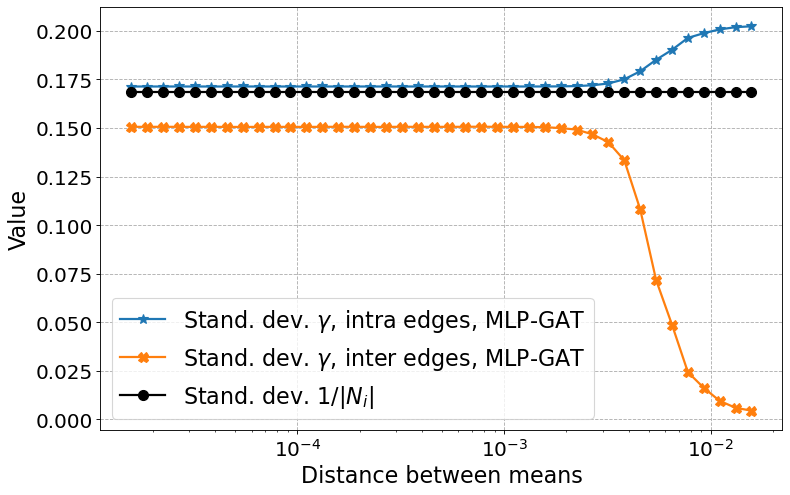

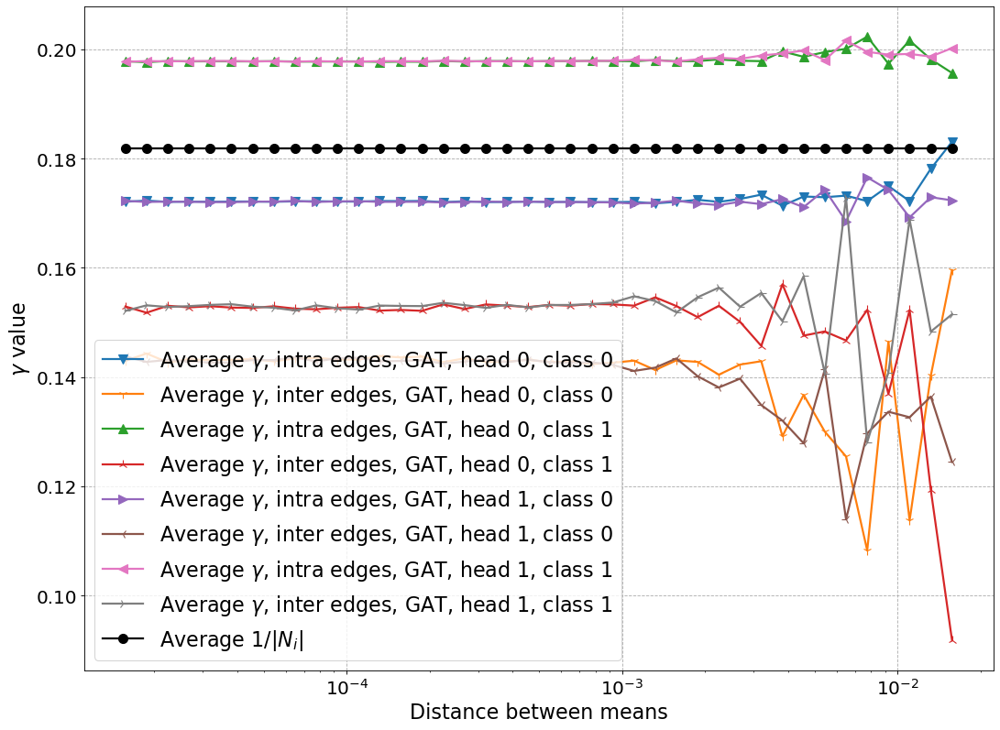

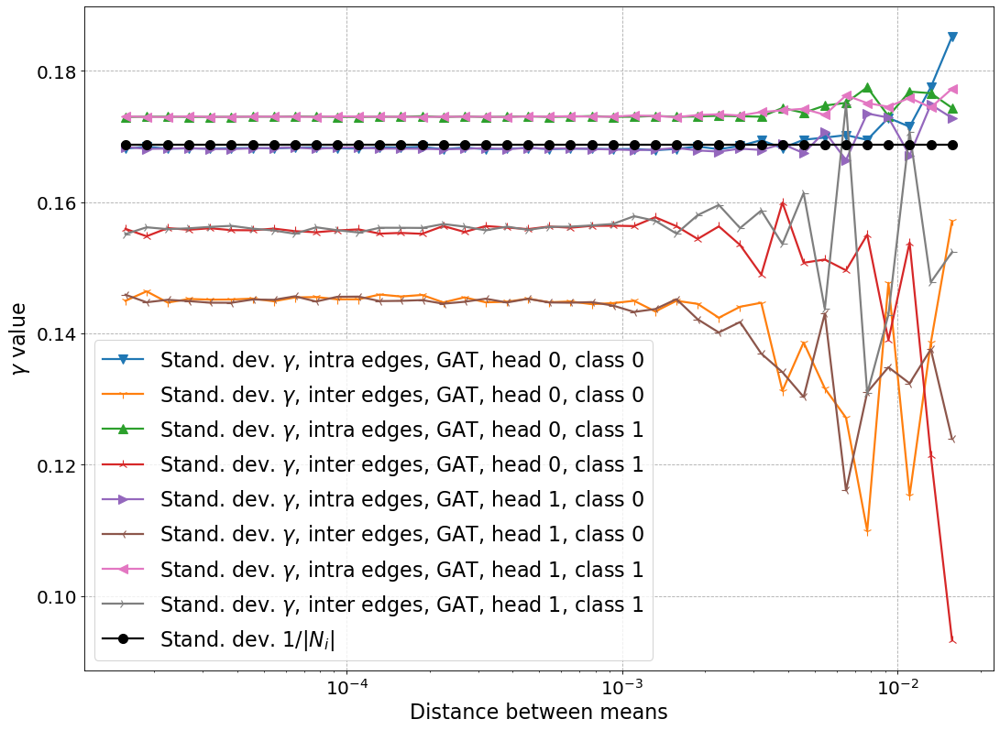

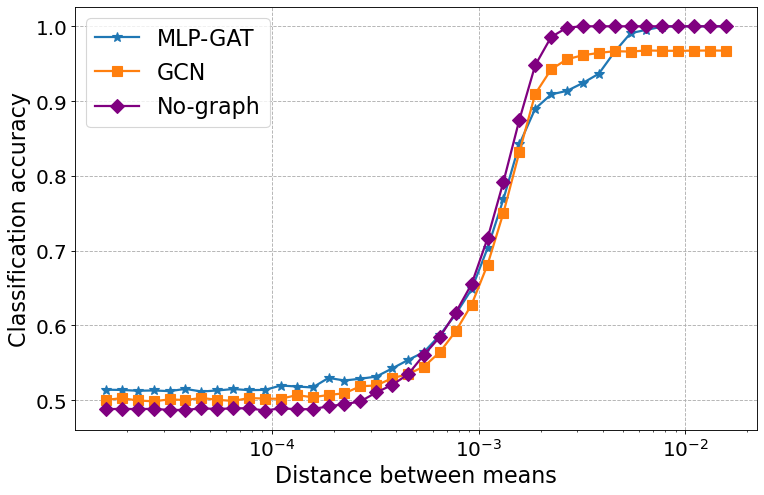

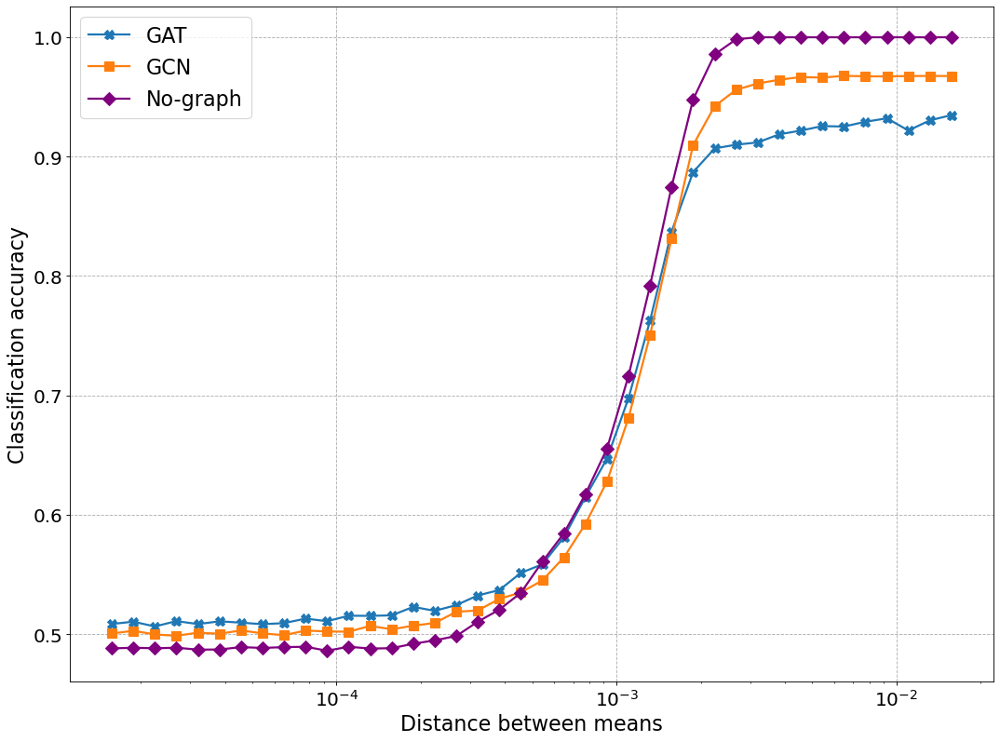

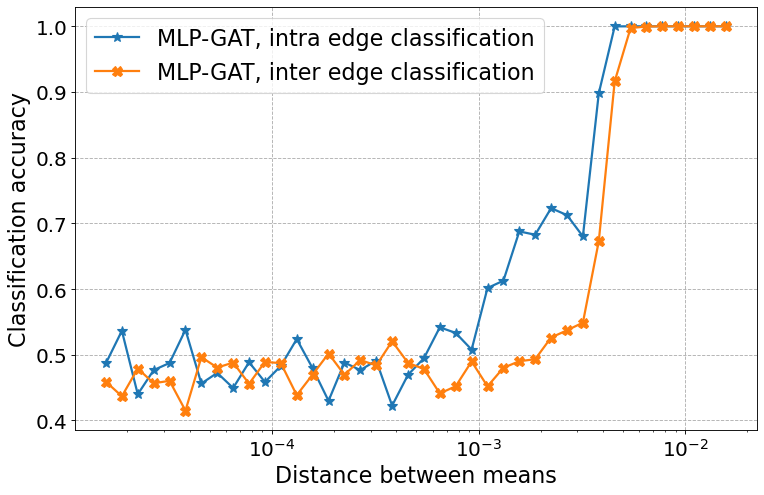

CiteSeer
Number of classes:  tensor(6, device='cuda:0')
Class:  0
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.1
GCN,     Loss: 0.1929584303249915 | Train: 1.0000 | Test: 0.4870
Linear,  Loss: 0.1077382436643044 | Train: 1.0000 | Test: 0.4440
MLP GAT, Loss: 0.1 | Train: 1.0000 | Test: 0.6380
Head:  0  acc intra edges:  0.45801788568496704  acc inter edges:  0.6035503149032593
GAT,     Loss: 0.2 | Train: 1.0000 | Test: 0.4670
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.2
GCN,     Loss: 0.1937740999584397 | Train: 1.0000 | Test: 0.4870
Linear,  Loss: 0.1077826773126920 | Train: 1.0000 | Test: 0.4460
MLP GAT, Loss: 0.1 | Train: 1.0000 | Test: 0.6480
Head:  0  acc intra edges:  0.4696725010871887  acc inter edges:  0.5695266127586365
GAT,     Loss: 0.1 | Train: 1.0000 | Test: 0.5890
mu/max(mus):  tensor(0.0010, device='cuda:0', dtype=torch.float64)  trial/trials:  0.3
GCN,     Loss: 0.1934912644947568 | Train:

KeyboardInterrupt: 

In [12]:
for dataset in datasets:
    print(dataset.name)
    data = dataset[0].to(device)
    n_classes = data.y.max() + 1
    print("Number of classes: ", n_classes)
    n = data.y.shape[0]
    data.x_backup = copy.deepcopy(data.x) 
    degree = torch_geometric.utils.degree(data.edge_index[1], n)
    
    for which_class in range(n_classes):
        print("Class: ", which_class)
        y = torch.zeros(n, dtype=torch.float64).to(device)
        idx = data.y == which_class
        y[idx] = 1
        data.ynew = y
        
#         data.x = data.x.to(torch.float64)
        
        mean0 = data.x_backup[idx].mean(dim=0)
        mean1 = data.x_backup[~idx].mean(dim=0)
        
        distance = torch.norm(mean0-mean1)
        mu = distance/(2*torch.sqrt(torch.tensor(data.x.shape[1])))
        
        mu_up = 10*mu
        mu_lb = 0.01*mu

        mus = torch.tensor(np.geomspace(mu_lb.item(), mu_up.item(), 40, endpoint=True)).to(device)
        
        test_acc_mlp_gat = []
        test_acc_gat = []
        test_acc_gcn = []
        test_acc_lin = []
        intra_gamma = []
        inter_gamma = []
        intra_gamma_std = []
        inter_gamma_std = []
        acc_intra_edges_all = []
        acc_inter_edges_all = []
        intra_gamma_ = [[[],[]],[[],[]]]
        inter_gamma_ = [[[],[]],[[],[]]]
        intra_gamma_std_ = [[[],[]],[[],[]]]
        inter_gamma_std_ = [[[],[]],[[],[]]]
        acc_intra_edges_all_ = [[],[]]
        acc_inter_edges_all_ = [[],[]]

        for mu_ in mus:
        
            new_mean0 = mu_*torch.ones(data.x.shape[1]).to(device)
            new_mean1 = -mu_*torch.ones(data.x.shape[1]).to(device)

            data.x[idx] = data.x_backup[idx] - mean0 + new_mean0
            data.x[~idx] = data.x_backup[~idx] - mean1 + new_mean1
            
            sum_test_acc_gcn = 0
            sum_test_acc_lin = 0
            sum_test_acc_mlp_gat = 0
            sum_test_acc_gat = 0
            
            sum_intra_gamma = 0
            sum_inter_gamma = 0
            sum_intra_gamma_std = 0
            sum_inter_gamma_std = 0
            sum_acc_intra_edges_all = 0
            sum_acc_inter_edges_all = 0
            
            sum_intra_gamma_ = [[0,0],[0,0]]
            sum_inter_gamma_ = [[0,0],[0,0]]
            sum_intra_gamma_std_ = [[0,0],[0,0]]
            sum_inter_gamma_std_ = [[0,0],[0,0]]

            weight_decay = 1.0e-3
            loss_tol = 1.0e-2
            epochs = 200
            
            trials = 10
            for trial in range(trials):
    
                print("mu/max(mus): ", mu_/max(mus), " trial/trials: ", (trial+1)/trials)
    
                loss, train_acc, test_acc = run_gcn(data, d=data.x.shape[1], out_d=1, device=device, weight_decay=weight_decay, loss_tol=loss_tol, epochs=epochs)
                print(f"GCN,     Loss: {loss:0.16f} | Train: {train_acc:0.4f} | Test: {test_acc:0.4f}")
                sum_test_acc_gcn += test_acc

                loss, train_acc, test_acc = run_linear(data, d=data.x.shape[1], out_d=1, device=device, weight_decay=weight_decay, loss_tol=loss_tol, epochs=epochs)
                print(f"Linear,  Loss: {loss:0.16f} | Train: {train_acc:0.4f} | Test: {test_acc:0.4f}")
                sum_test_acc_lin += test_acc

                loss, train_acc, test_acc, model_mlp_gat = run_mlp_gat(data, d=data.x.shape[1], out_d=1, device=device, weight_decay=weight_decay, loss_tol=loss_tol, epochs=epochs)
                print(f"MLP GAT, Loss: {loss:0.1f} | Train: {train_acc:0.4f} | Test: {test_acc:0.4f}")
                sum_test_acc_mlp_gat += test_acc

                logits, attn_weights, pair_pred = model_mlp_gat(data) 
                intra_weight, idx_intra, inter_weight, idx_inter = info_mlp_gat(attn_weights, idx, 0)
                sum_intra_gamma += np.asarray(intra_weight).mean()
                sum_inter_gamma += np.asarray(inter_weight).mean()
                sum_intra_gamma_std += np.asarray(intra_weight).std()
                sum_inter_gamma_std += np.asarray(inter_weight).std()
                acc_intra_edges, acc_inter_edges = pair_acc(attn_weights[0][0].shape[0], pair_pred, idx_intra, idx_inter, 0)
                sum_acc_intra_edges_all += acc_intra_edges.cpu()
                sum_acc_inter_edges_all += acc_inter_edges.cpu()

                heads = 2
                loss, train_acc, test_acc, model_gat = run_gat(data, d=data.x.shape[1], out_d=1, K=heads, device=device, weight_decay=weight_decay, loss_tol=loss_tol, epochs=epochs)
                print(f"GAT,     Loss: {loss:0.1f} | Train: {train_acc:0.4f} | Test: {test_acc:0.4f}")
                sum_test_acc_gat += test_acc
                
                logits, attn_weights, pair_pred = model_gat(data)                     
                for head in range(heads):
                    intra_weight, idx_intra, inter_weight, idx_inter = info_gat(attn_weights, idx, head)
                    for class_ in range(2):
                        sum_intra_gamma_[head][class_] += np.asarray(intra_weight[class_]).mean()
                        sum_inter_gamma_[head][class_] += np.asarray(inter_weight[class_]).mean()
                        sum_intra_gamma_std_[head][class_] += np.asarray(intra_weight[class_]).std()
                        sum_inter_gamma_std_[head][class_] += np.asarray(inter_weight[class_]).std()

            test_acc_gcn.append(sum_test_acc_gcn/trials)
            test_acc_lin.append(sum_test_acc_lin/trials)
            test_acc_mlp_gat.append(sum_test_acc_mlp_gat/trials)
            test_acc_gat.append(sum_test_acc_gat/trials)
            intra_gamma.append(sum_intra_gamma/trials)
            inter_gamma.append(sum_inter_gamma/trials)
            intra_gamma_std.append(sum_intra_gamma_std/trials)
            inter_gamma_std.append(sum_inter_gamma_std/trials)
            acc_intra_edges_all.append(sum_acc_intra_edges_all/trials)
            acc_inter_edges_all.append(sum_acc_inter_edges_all/trials)
                
            for head in range(heads):
                for class_ in range(2):
                    intra_gamma_[head][class_].append(sum_intra_gamma_[head][class_]/trials)
                    inter_gamma_[head][class_].append(sum_inter_gamma_[head][class_]/trials)
                    intra_gamma_std_[head][class_].append(sum_intra_gamma_std_[head][class_]/trials)
                    inter_gamma_std_[head][class_].append(sum_inter_gamma_std_[head][class_]/trials)
                
        my_plot(dataset.name, which_class, heads, mus, degree, intra_gamma, inter_gamma, intra_gamma_, inter_gamma_, 
                intra_gamma_std, inter_gamma_std, intra_gamma_std_, inter_gamma_std_, 
                test_acc_mlp_gat, test_acc_gat, test_acc_gcn, test_acc_lin, 
                acc_intra_edges_all, acc_inter_edges_all, acc_intra_edges_all_, acc_inter_edges_all_)